C:/Users/admin/Desktop/EMG_IA_LIT GITHUB/EMG_IA_LIT/EMG-LIT/EMG-S1


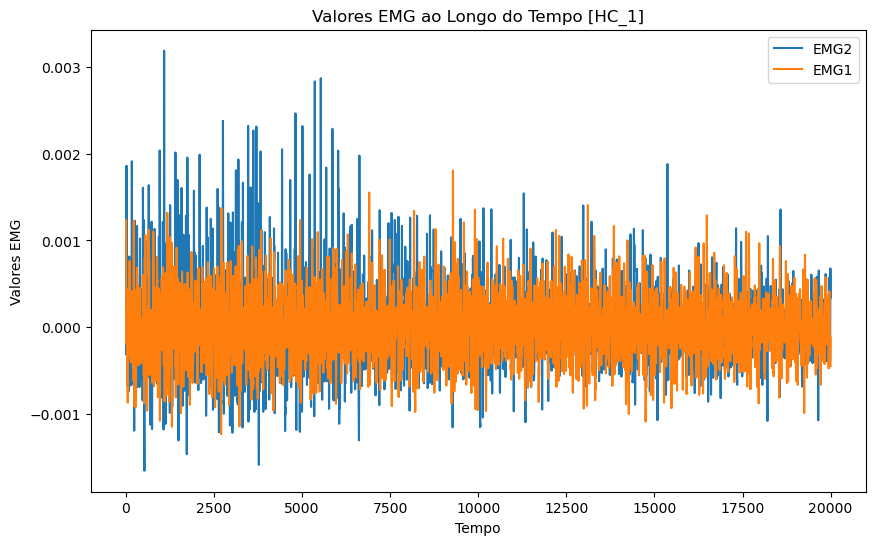

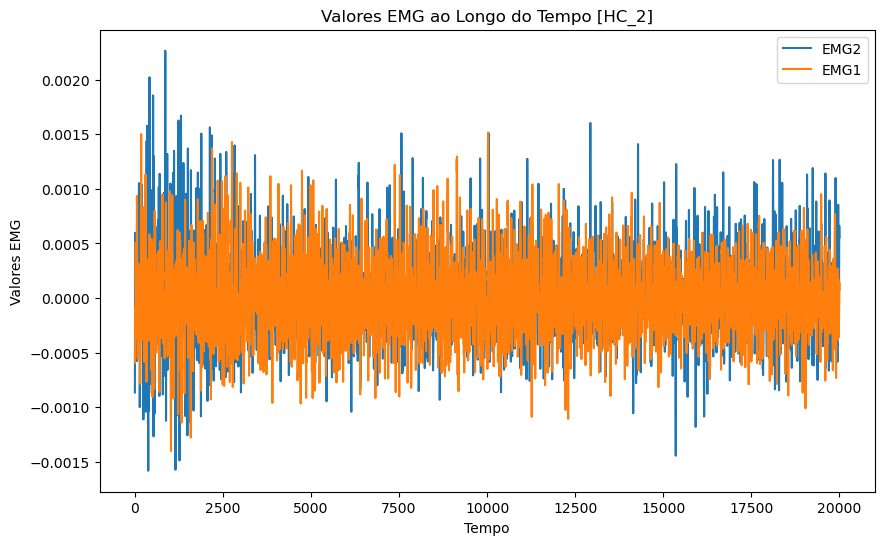

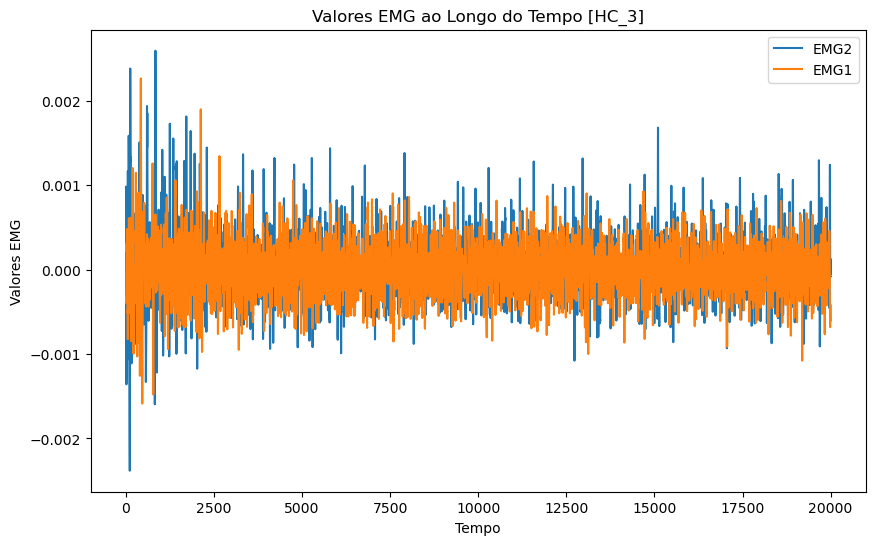

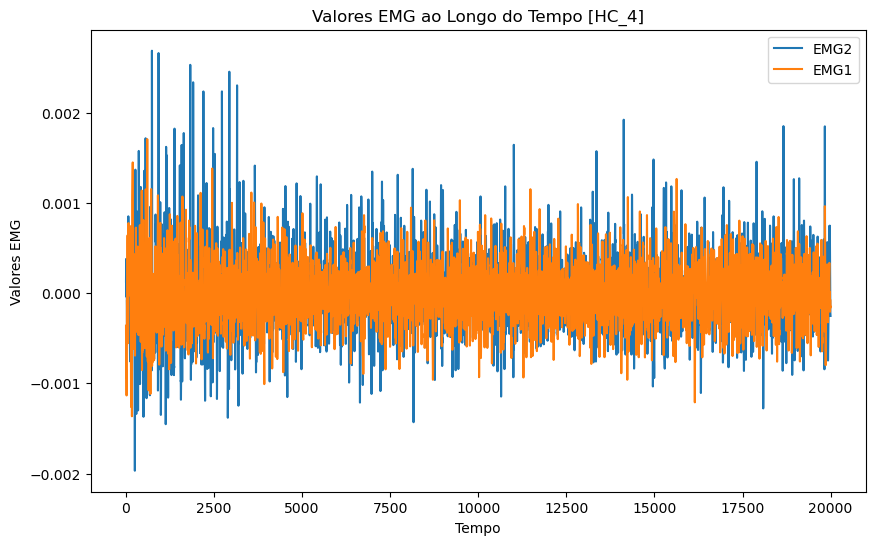

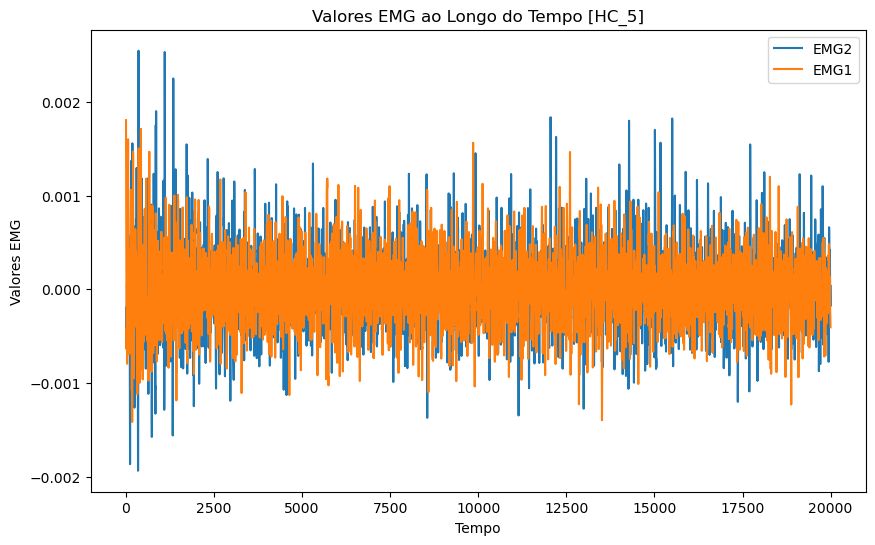

...

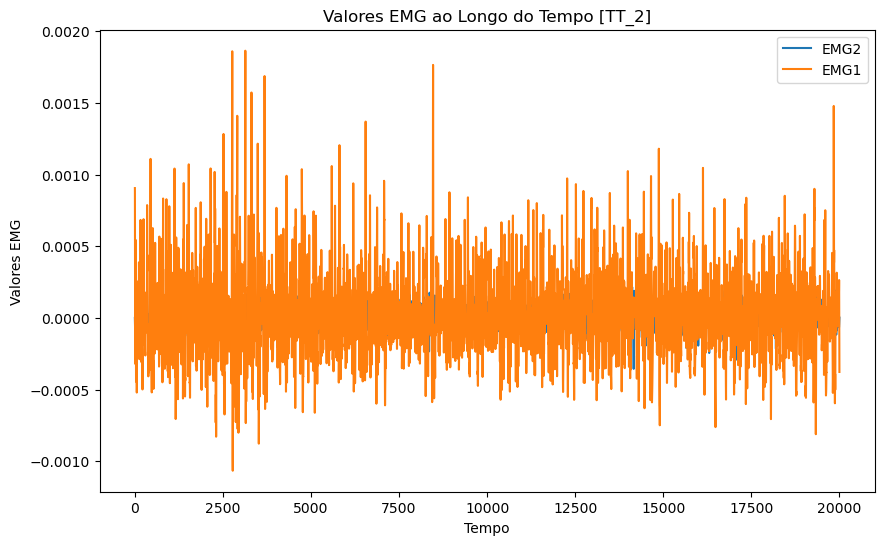

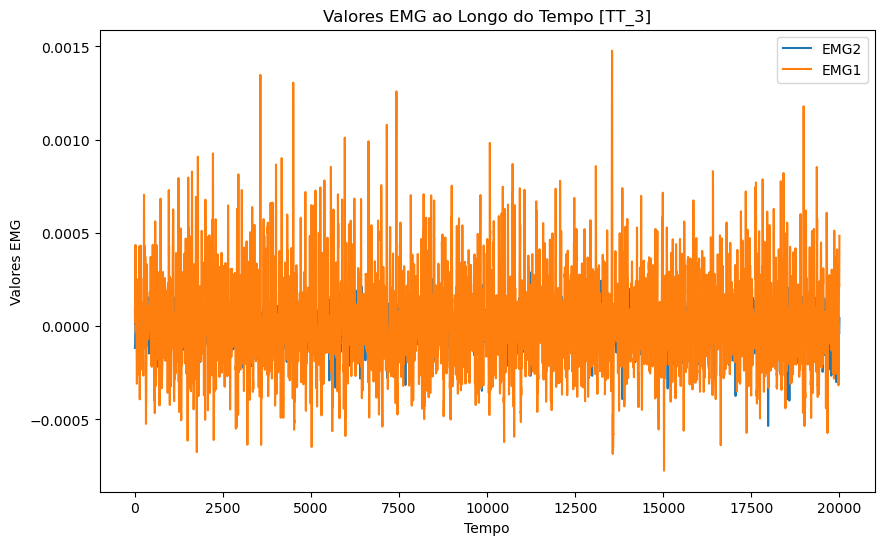

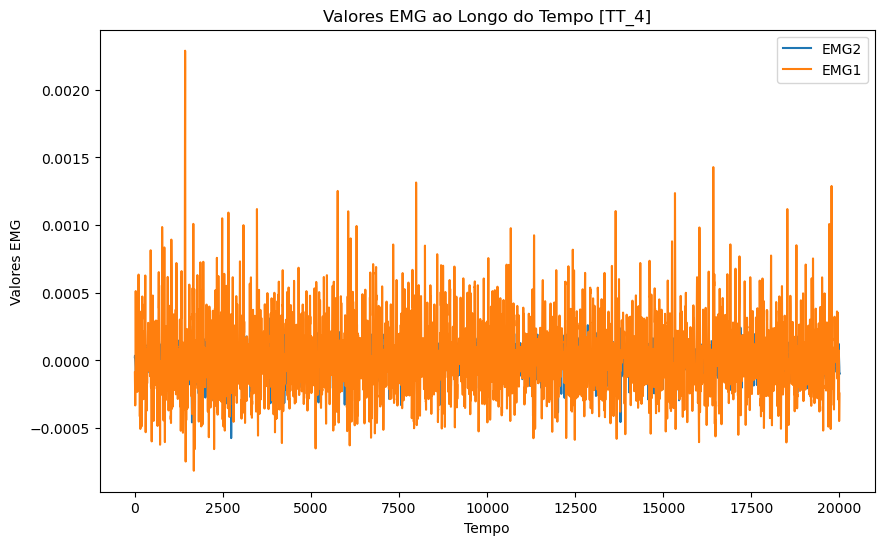

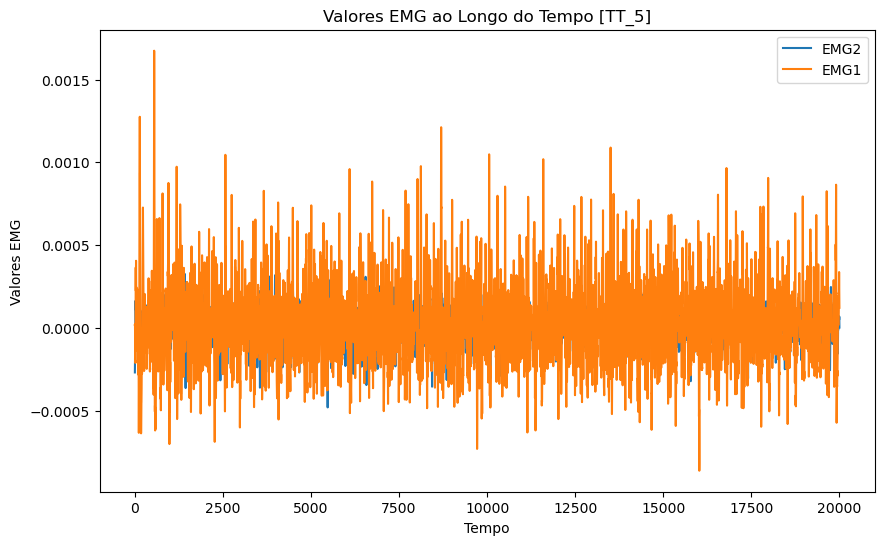

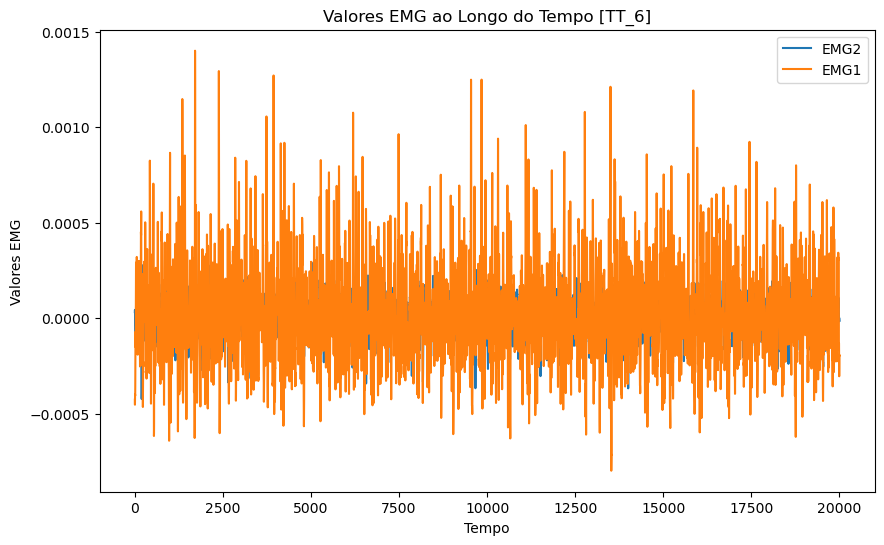

Valor mínimo de EMG1: -0.001229651
Valor máximo de EMG1: 0.001803079
Valor mínimo de EMG2: -0.001649887
Valor máximo de EMG2: 0.003183397


In [176]:
%run "./2_Visualizacao_dos_dados.ipynb"

## Pre-processamento dos dados

Utilizaremos z-score para remover outliers, e substituíremos os outliers removidos pela média.

A extração de características e features será feita usando a função getfTDDfeat_v2.

In [177]:
from scipy.stats import zscore

In [178]:
# Substitua 'EMG1' e 'EMG2' pelos nomes reais das colunas
coluna_emg1 = 'EMG1'
coluna_emg2 = 'EMG2'

In [179]:
colunas_relevantes = ['EMG1', 'EMG2']

In [180]:
# Definir um limiar para identificar outliers (por exemplo, 3)
limiar_z = 1

In [181]:
"""
% getfTDDfeat_v2: A Fusion of Time-Domain Descriptors.
%
% feat = getfTDDfeat_v2(x,winsize,wininc,datawin,dispstatus)
%
% Author Rami Khushaba 
%
% This function computes the fused time-domain features of the signals in x,
% x could be made of many columns (or just one), each representing a channel/sensor. 
% For example if you get 5 sec of data from 8 channels/sensors at 1000 Hz 
% then x should be 5000 x 8. A windowing scheme is used here to extract features 
%
% The signals in x are divided into multiple windows of size
% winsize and the windows are space wininc apart.
%
%
% Inputs
%    x: 		columns of signals
%    steps:     variable denoting the number of steps away from the current window (for example a number from 3 to 25, read the paper)
%    winsize:	window size (length of x)
%    wininc:	spacing of the windows (winsize)
%    datawin:   window for data (e.g. Hamming, default rectangular)
%               must have dimensions of (winsize,1)
%    dispstatus:zero for no waitbar (default)
%
% Outputs
%    feat:      fused time domain features (6 features per channel)
%             
%
% Modifications
% 23/06/2004   template imported from http://www.sce.carleton.ca/faculty/chan/index.php?page=matlab
% 17/11/2013   RK: Spectral moments first created.
% 15/01/2016   RK: created fTDD method
% 21/02/2019   RK: moving this to GitHub
% 13/03/2020   RK: added version v2
%% P.S: The main difference in v2 from the originally published is the fact that the original had (num./den) .* (num2./den2). However, as we are taking the logarthimic version of num and den then subtracting these is also equivalent to division, i.e., log(num./den) = log(num)-log(den) which we did here.

%% References
% [1] R. N. Khushaba, A. Al-Ani, A. Al-Timemy, A. Al-Jumaily, "A Fusion of Time-Domain Descriptors for Improved Myoelectric Hand Control", ISCIT2016 Conference, Greece, 2016.
% pdf here: https://pdfs.semanticscholar.org/4730/98af39c66b0a4b541860a1f4617c036d8249.pdf
% [2] A. Al-Timemy, R. N. Khushaba, G. Bugmann, and J. Escudero, "Improving the Performance Against Force Variation of EMG Controlled Multifunctional Upper-Limb Prostheses for Transradial Amputees", 
%     IEEE Transactions on Neural Systems and Rehabilitation Engineering, DOI: 10.1109/TNSRE.2015.2445634, 2015.
% [3] R. N. Khushaba, Maen Takruri, Jaime Valls Miro, and Sarath Kodagoda, "Towards limb position invariant myoelectric pattern recognition using time-dependent spectral features", 
%     Neural Networks, vol. 55, pp. 42-58, 2014. 
"""
import numpy as np

def getfTDDfeat_v2(x,steps,winsize,wininc):
    
    # x should be a numpy array
    x = np.array(x)
       
    if len(x.shape)==1:
        x=x[:,np.newaxis]
        
    datasize = x.shape[0]
    Nsignals = x.shape[1]
    numwin = int(np.floor((datasize - winsize)/wininc)+1)
    
    # define the number of features/channel
    NFPC = 6
    
    # allocate memory
    feat = np.zeros((numwin-steps,Nsignals*NFPC))
    
    # Prepare start and end indices
    st = 0+steps*wininc
    en = winsize+steps*wininc
    for i in range(numwin-steps):
        
        # define your current window
        curwin = x[st:en,:]
        
        # steps1: Extract features from original signal and a nonlinear version of the previous window
        ebp = KSM1(x[(st-steps*wininc):(en-steps*wininc),:])
        efp = KSM1(np.log(x[(st-steps*wininc):(en-steps*wininc),:]**2+np.spacing(1))**2)
        
        # steps2: Correlation analysis
        num = -2*np.multiply(ebp,efp)
        den = np.multiply(efp,efp)+np.multiply(ebp,ebp)
        
        # steps1: Extract features from original signal and a nonlinear version of it
        ebp = KSM1(curwin)
        efp = KSM1(np.log(curwin**2+np.spacing(1))**2)
        
        # steps2: Correlation analysis
        num2 = -2*np.multiply(ebp,efp)
        den2 = np.multiply(efp,efp)+np.multiply(ebp,ebp)
        
        """
        **************************************************************
        Notice the subtraction of (num-den) and (num2-den2)
        and then multiplying these two terms,
        this is what makes it v2.
        **************************************************************
        """
        # feature extraction goes here
        feat[i,:] = np.multiply(num-den,num2-den2)
        
        # go forward
        st = st + wininc
        en = en + wininc
    #feat = feat[:end-steps,:]
    return feat

def  KSM1(S):
    """
    % Time-domain power spectral moments (TD-PSD)
    % Using Fourier relations between time domina and frequency domain to
    % extract power spectral moments dircetly from time domain.
    %
    % Modifications
    % 17/11/2013  RK: Spectral moments first created.
    % 02/03/2014  AT: I added 1 to the function name to differentiate it from other versions from Rami
    % 
    % References
    % [1] A. Al-Timemy, R. N. Khushaba, G. Bugmann, and J. Escudero, "Improving the Performance Against Force Variation of EMG Controlled Multifunctional Upper-Limb Prostheses for Transradial Amputees", 
    %     IEEE Transactions on Neural Systems and Rehabilitation Engineering, DOI: 10.1109/TNSRE.2015.2445634, 2015.
    % [2] R. N. Khushaba, Maen Takruri, Jaime Valls Miro, and Sarath Kodagoda, "Towards limb position invariant myoelectric pattern recognition using time-dependent spectral features", 
    %     Neural Networks, vol. 55, pp. 42-58, 2014. 
    """
    
    # Get the size of the input signal
    samples,channels = S.shape
    
    if channels>samples:
        S  = np.transpose(S);
        samples,channels = S.shape
    
    # Root squared zero order moment normalized
    m0     = np.sqrt(np.sum(S**2,axis=0))[:,np.newaxis]
    m0     = m0**.1 / .1;
    
    # Prepare derivatives for higher order moments
    d1     = np.diff(np.concatenate([np.zeros((1,channels)),np.diff(S,n=1,axis=0)],axis=0),n=1,axis=0)
    d2     = np.diff(np.concatenate([np.zeros((1,channels)),np.diff(d1,n=1,axis=0)],axis=0),n=1,axis=0)
    
    # Root squared 2nd and 4th order moments normalized
    m2     = np.sqrt(np.sum(d1**2,axis=0)/(samples-1))[:,np.newaxis]
    m2     = m2**.1/.1
    
    m4     = np.sqrt(np.sum(d2**2,axis=0)/(samples-1))[:,np.newaxis]
    m4     = m4**.1/.1;
    
    # Sparseness
    sparsi = m0/np.sqrt(np.abs((m0-m2)*(m0-m4)))
    
    # Irregularity Factor
    IRF    = m2/np.sqrt(np.multiply(m0,m4))
    
    # Waveform length ratio
    WLR    = np.sum(np.abs(d1),axis=0)/np.sum(np.abs(d2),axis=0)
    WLR = WLR[:,np.newaxis]
    # All features together
    Feat   = np.concatenate((m0, m0-m2, m0-m4,sparsi, IRF, WLR), axis=0)
    Feat   = np.log(np.abs(Feat)).flatten()
    
    return Feat


In [182]:
# Defina outros parâmetros necessários
#steps = 5  # valor hipotético, substitua pelo valor desejado
#winsize = 100  # substitua pelo tamanho da janela desejado
#wininc = 100  # substitua pelo espaçamento entre as janelas desejado

In [183]:
# Defina outros parâmetros necessários
steps = 50  # valor hipotético, substitua pelo valor desejado
winsize = 200  # substitua pelo tamanho da janela desejado
wininc = 200  # substitua pelo espaçamento entre as janelas desejado

## HC

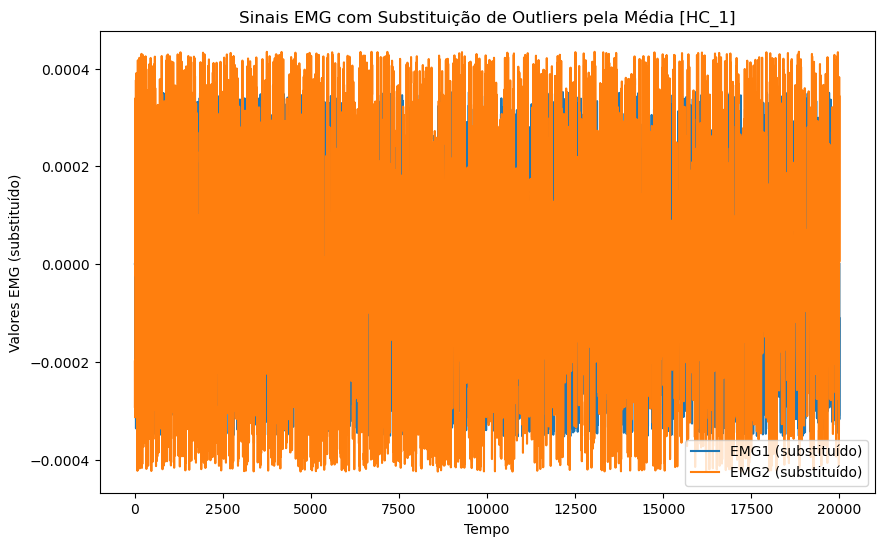

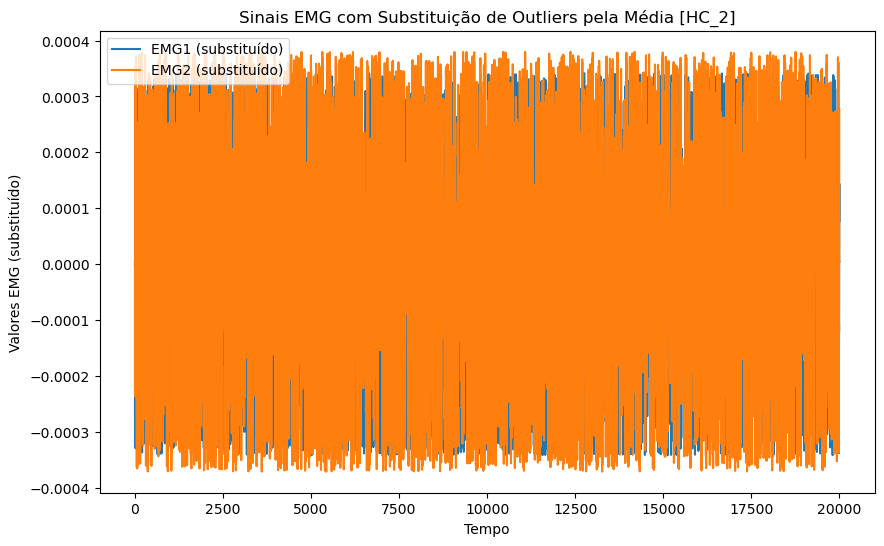

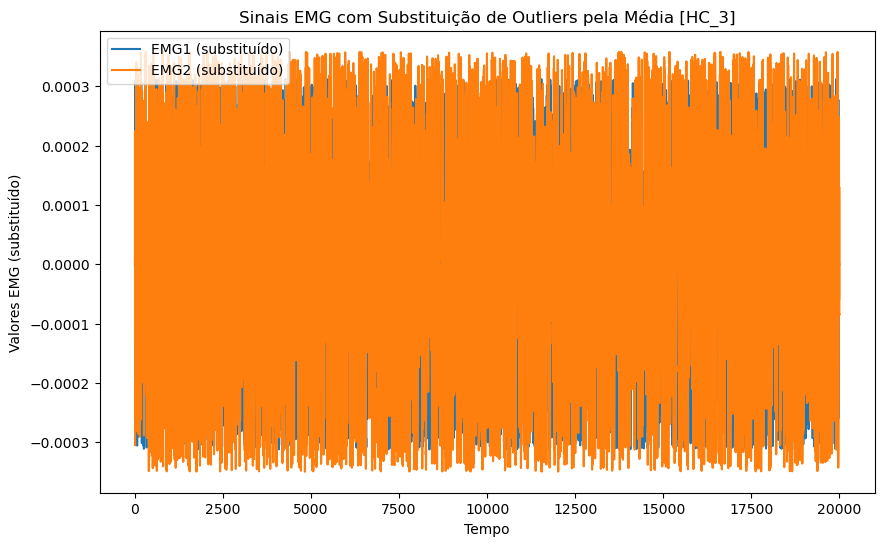

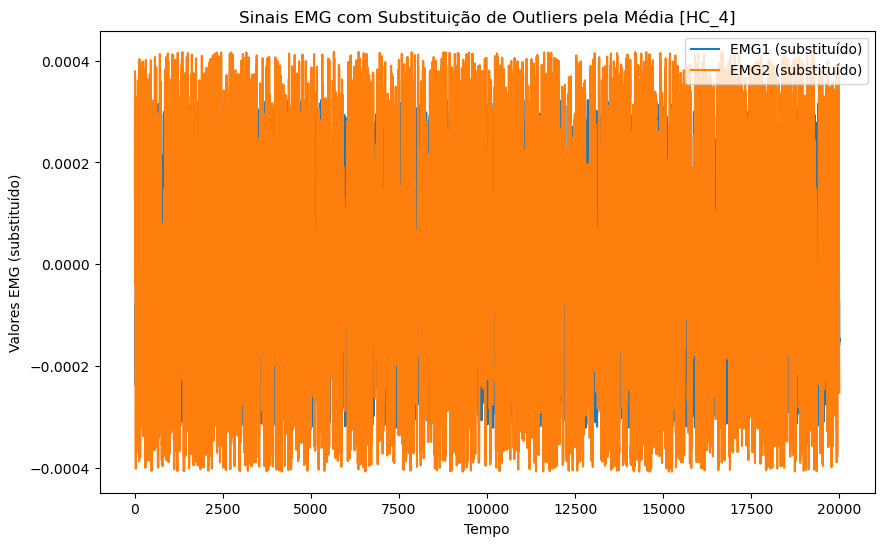

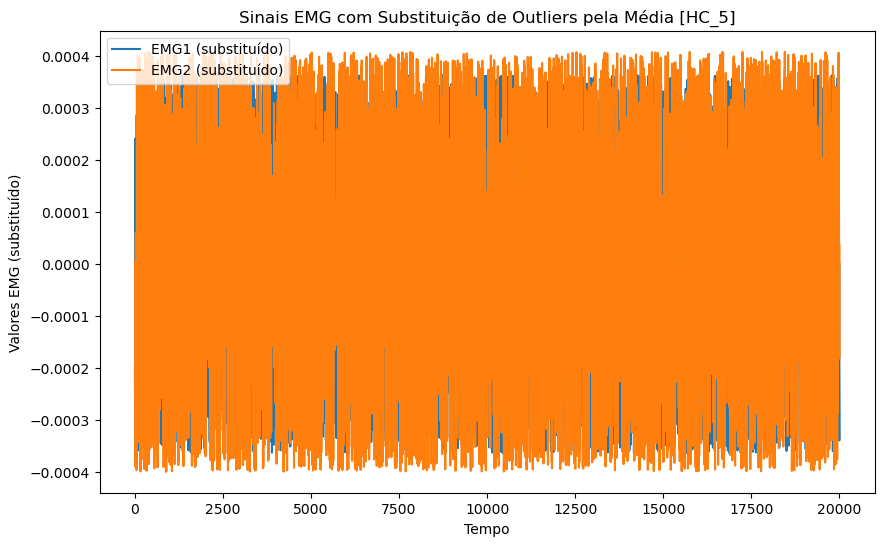

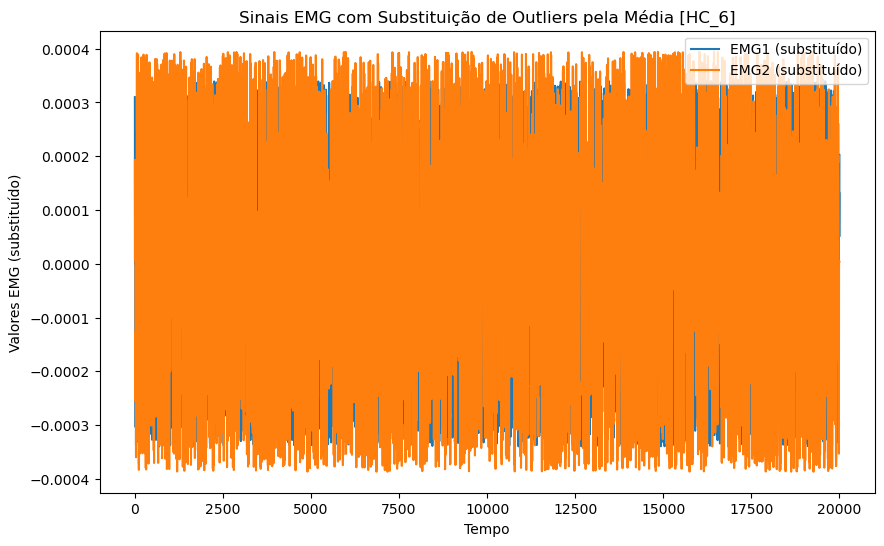

In [184]:
# Lista para armazenar os DataFrames resultantes
df_HC_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_HC_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (HC_1, HC_2, ..., HC_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_HC_1, df_HC_2, ..., df_HC_6)
    df_name = f'df_HC_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_HC_no_outliers_current = df_current.copy()
    df_HC_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_HC_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_HC_no_outliers_list.append(df_HC_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_HC_no_outliers_current.index, df_HC_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_HC_no_outliers_current.index, df_HC_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [HC_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_HC_no_outliers.append(df_HC_no_outliers_current)


In [185]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_HC_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_HC = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_HC{i+1}'] = caracteristicas_emg_HC

## I

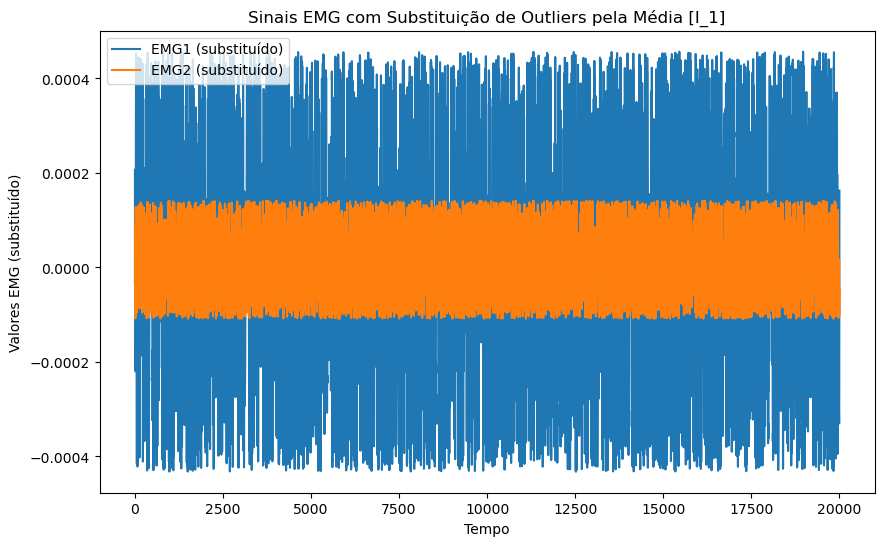

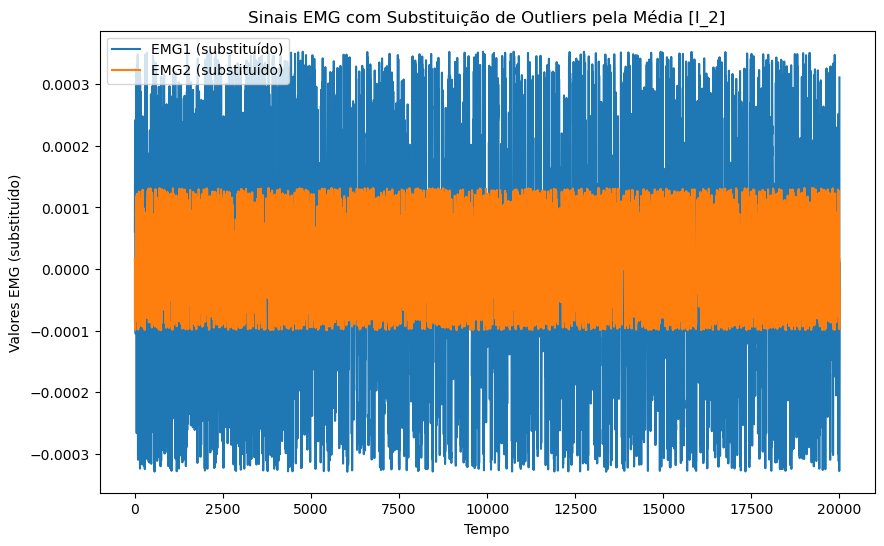

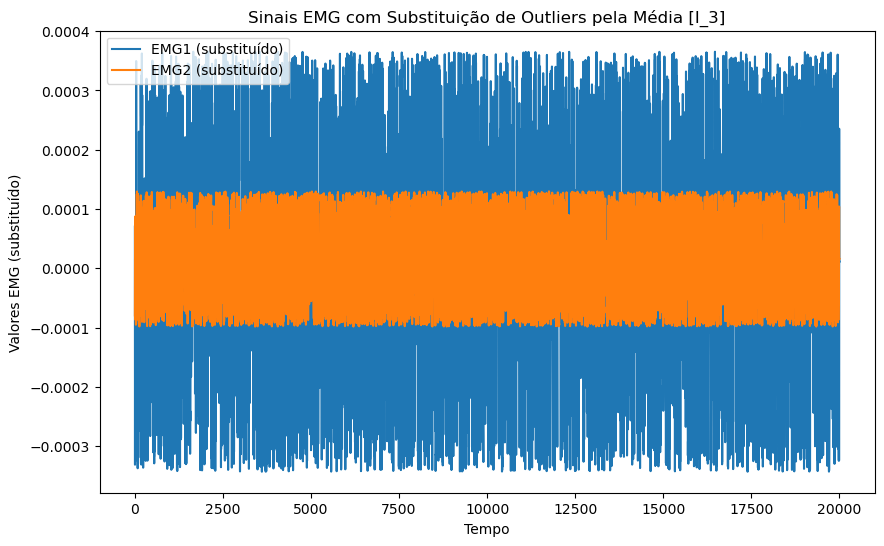

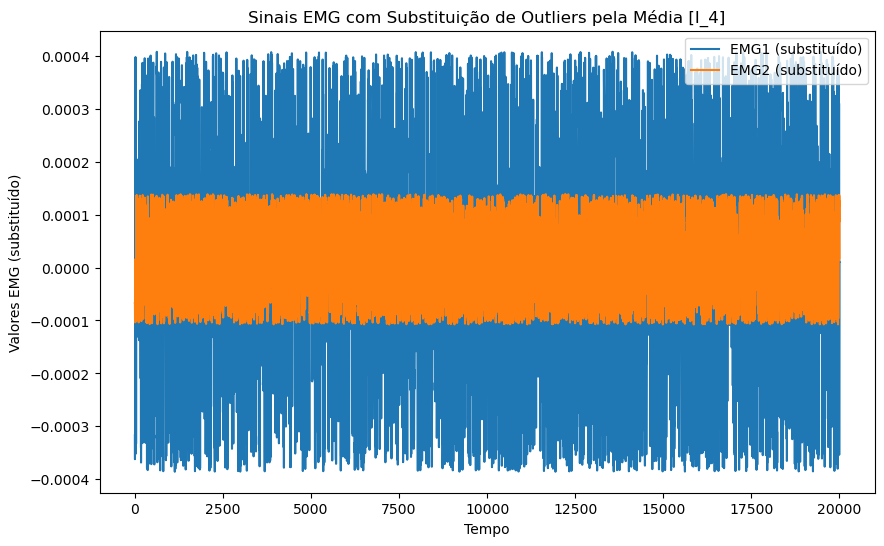

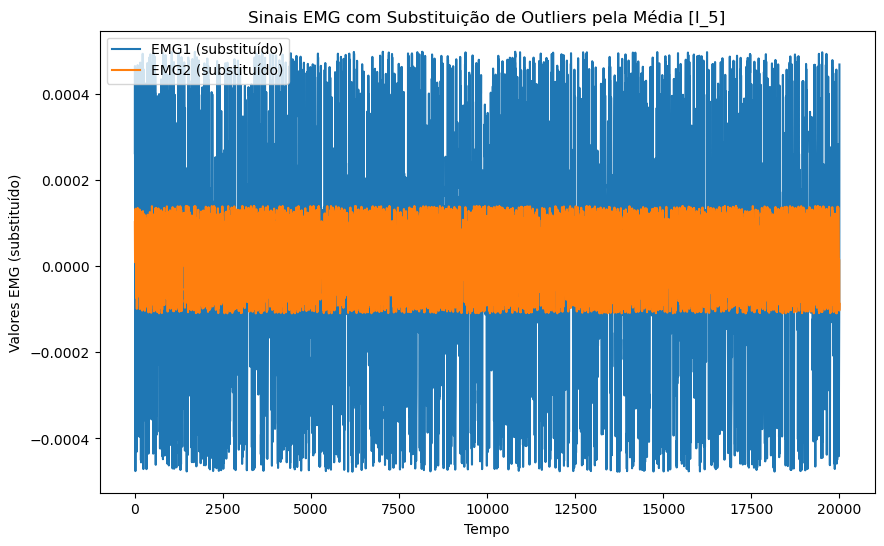

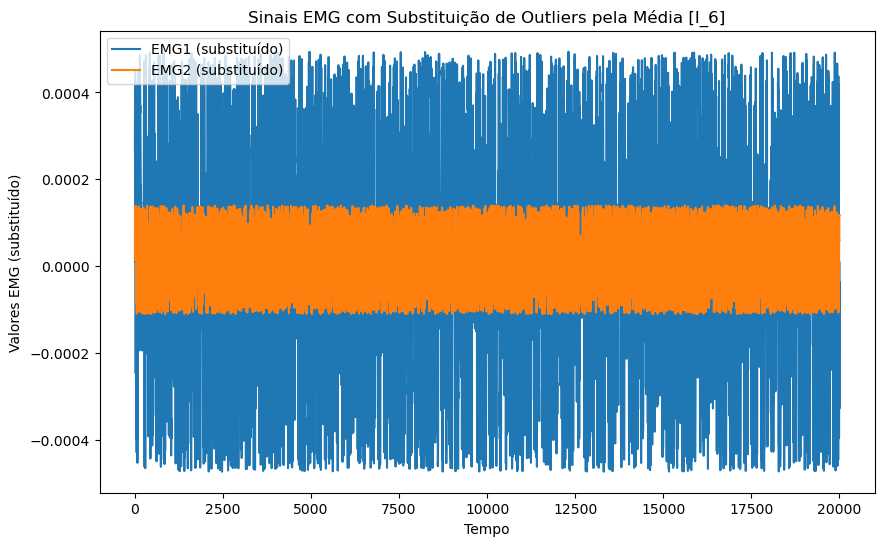

In [186]:
# Lista para armazenar os DataFrames resultantes
df_I_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_I_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (I_1, I_2, ..., I_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_I_1, df_I_2, ..., df_I_6)
    df_name = f'df_I_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_I_no_outliers_current = df_current.copy()
    df_I_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_I_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_I_no_outliers_list.append(df_I_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_I_no_outliers_current.index, df_I_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_I_no_outliers_current.index, df_I_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [I_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_I_no_outliers.append(df_I_no_outliers_current)


In [187]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_I_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_I = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_I{i+1}'] = caracteristicas_emg_I

## L

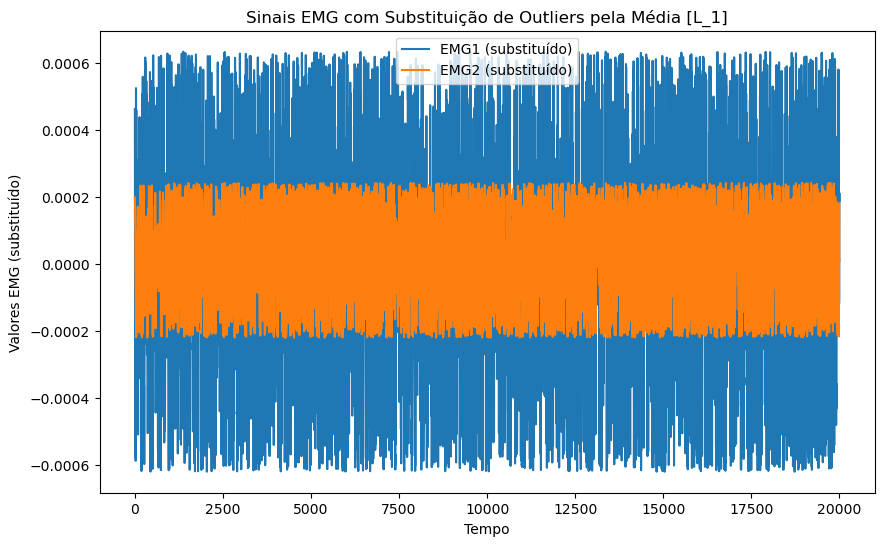

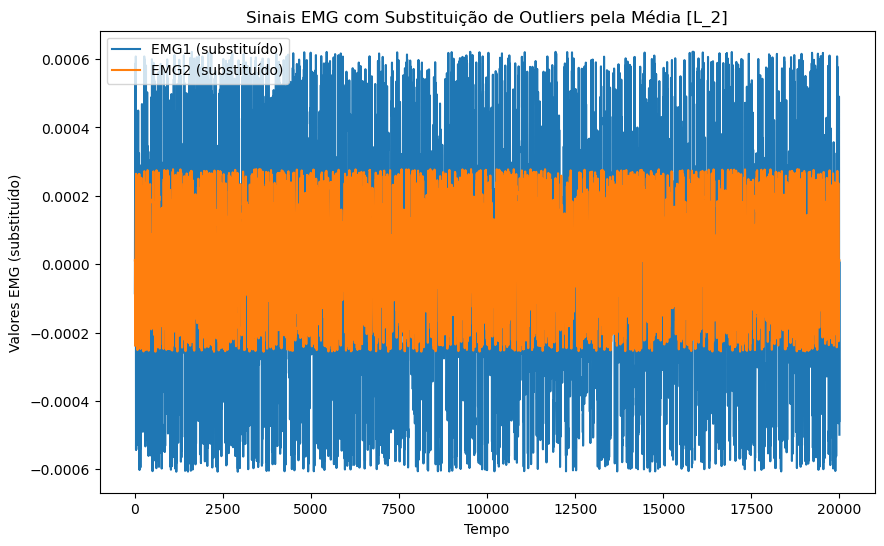

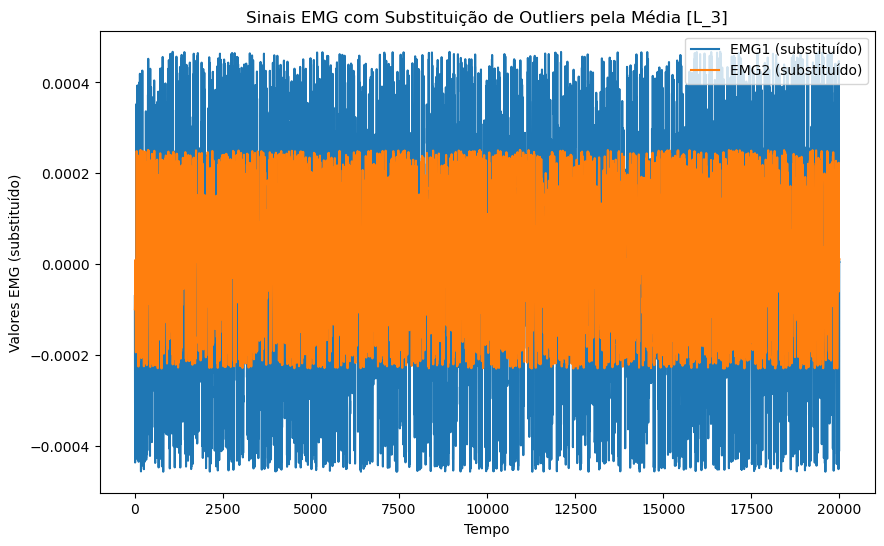

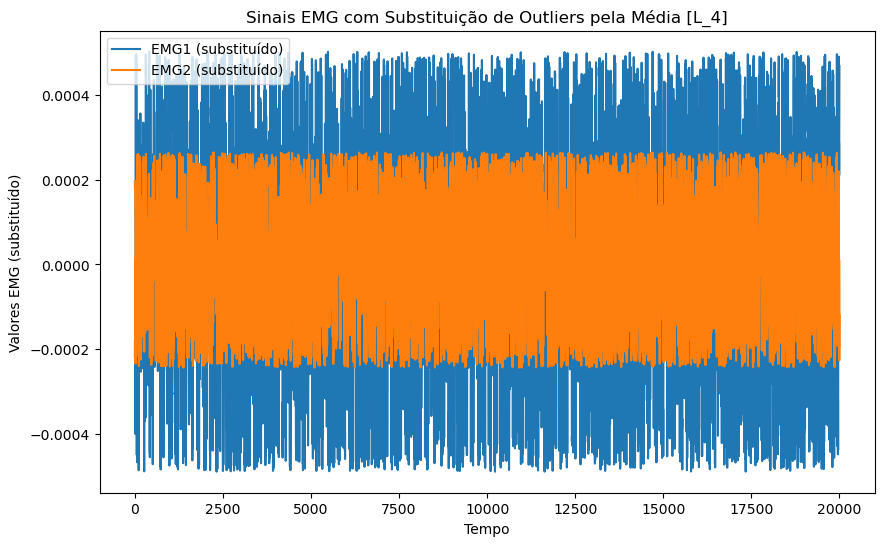

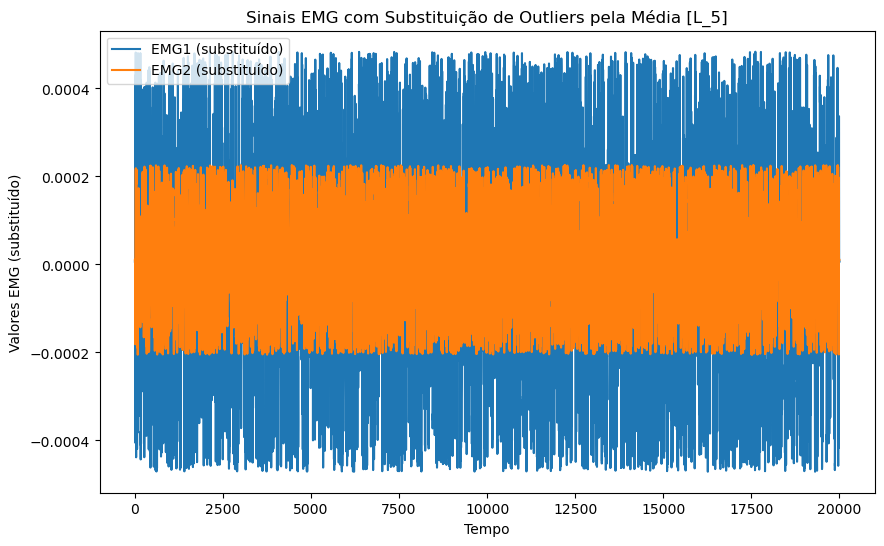

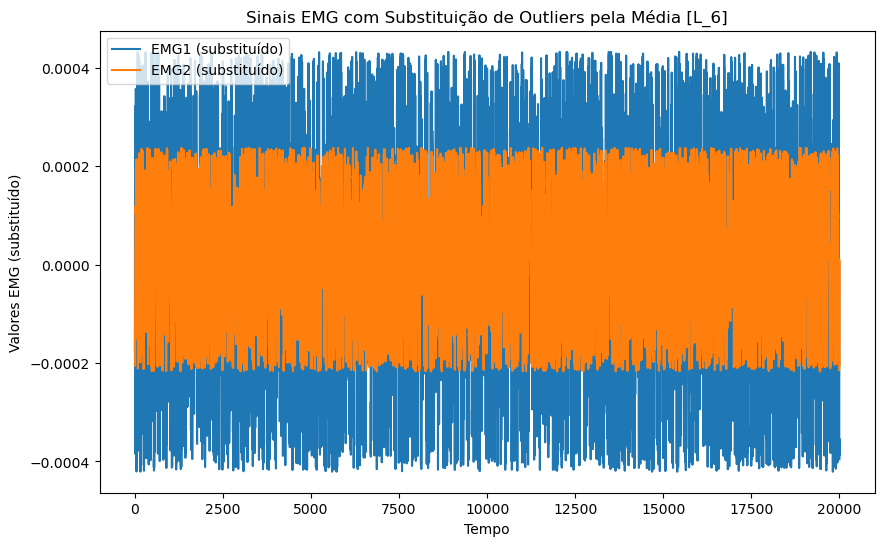

In [188]:
# Lista para armazenar os DataFrames resultantes
df_L_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_L_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (L_1, L_2, ..., L_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_L_1, df_L_2, ..., df_L_6)
    df_name = f'df_L_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_L_no_outliers_current = df_current.copy()
    df_L_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_L_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_L_no_outliers_list.append(df_L_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_L_no_outliers_current.index, df_L_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_L_no_outliers_current.index, df_L_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [L_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_L_no_outliers.append(df_L_no_outliers_current)


In [189]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_L_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_L = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_L{i+1}'] = caracteristicas_emg_L

##

## M

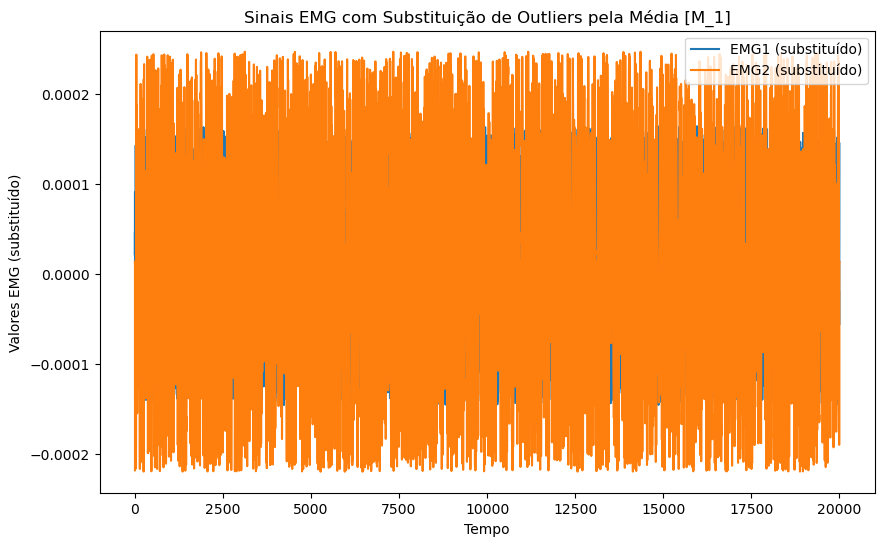

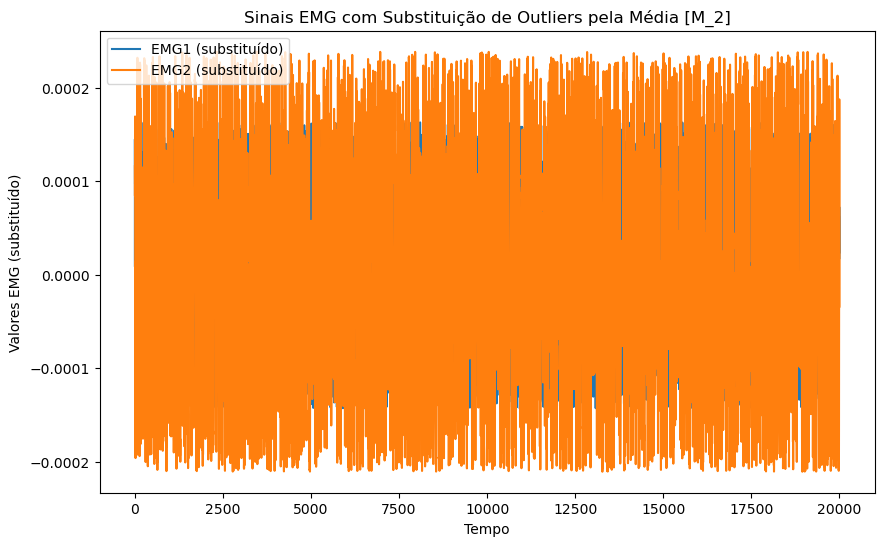

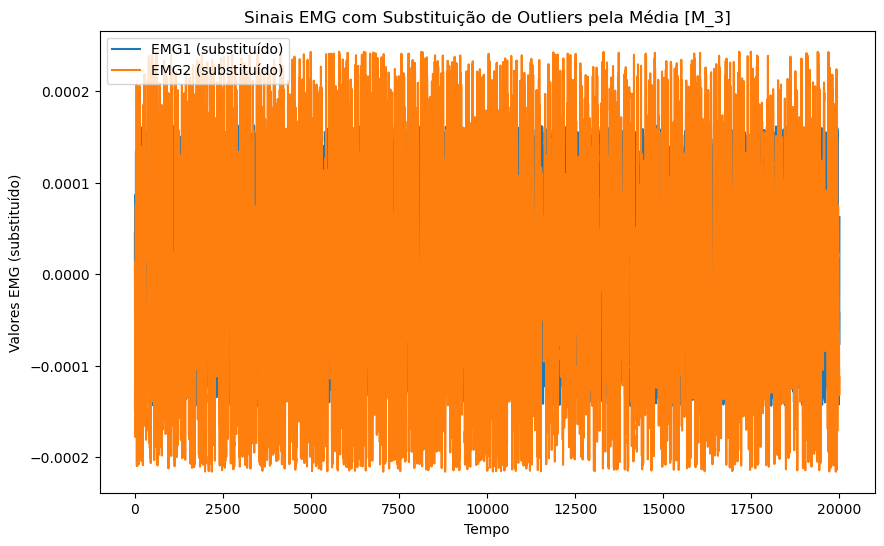

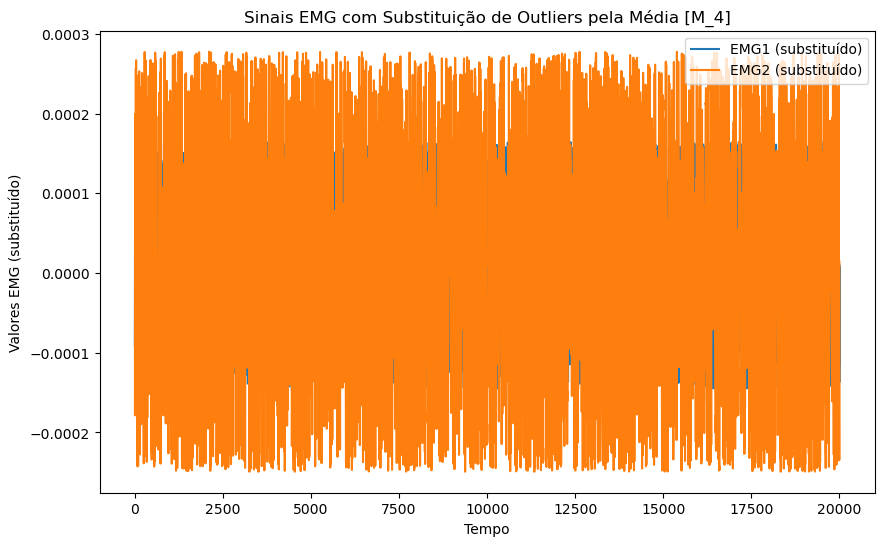

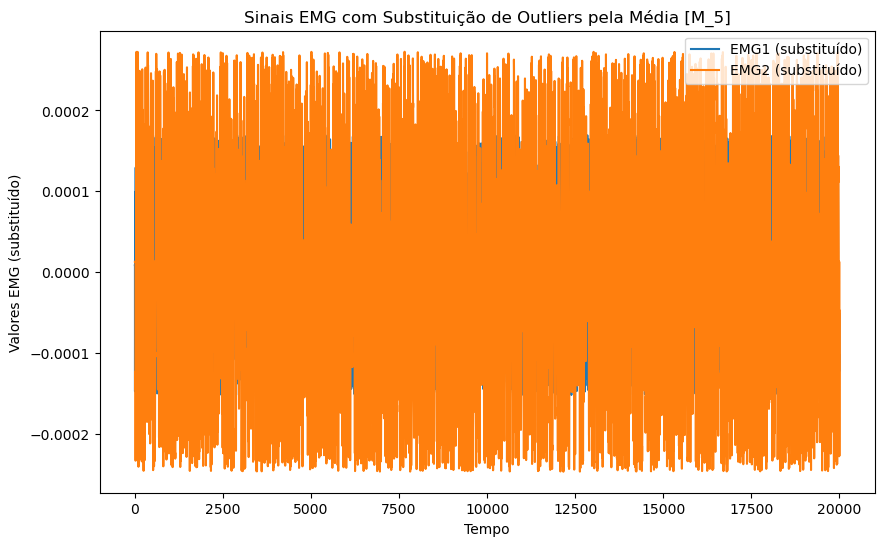

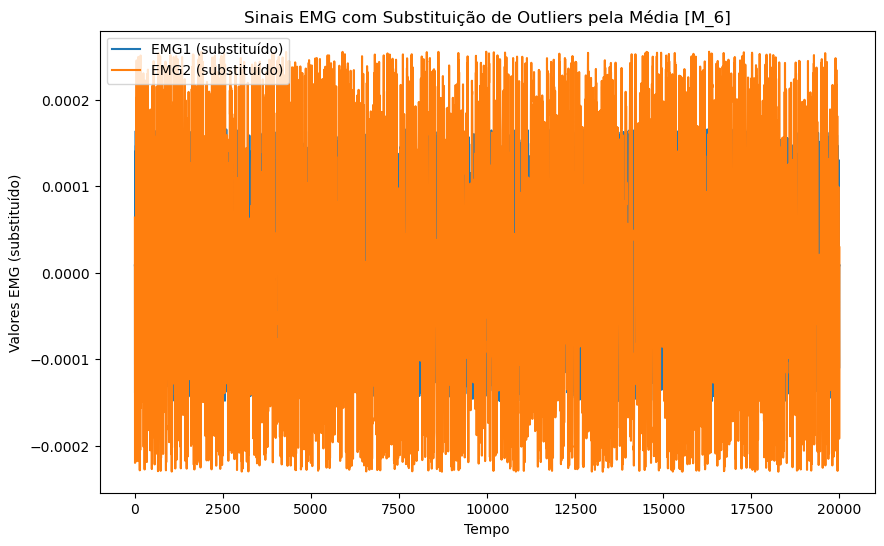

In [190]:
# Lista para armazenar os DataFrames resultantes
df_M_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_M_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (M_1, M_2, ..., M_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_M_1, df_M_2, ..., df_M_6)
    df_name = f'df_M_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_M_no_outliers_current = df_current.copy()
    df_M_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_M_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_M_no_outliers_list.append(df_M_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_M_no_outliers_current.index, df_M_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_M_no_outliers_current.index, df_M_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [M_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_M_no_outliers.append(df_M_no_outliers_current)


In [191]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_M_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_M = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_M{i+1}'] = caracteristicas_emg_M

## R

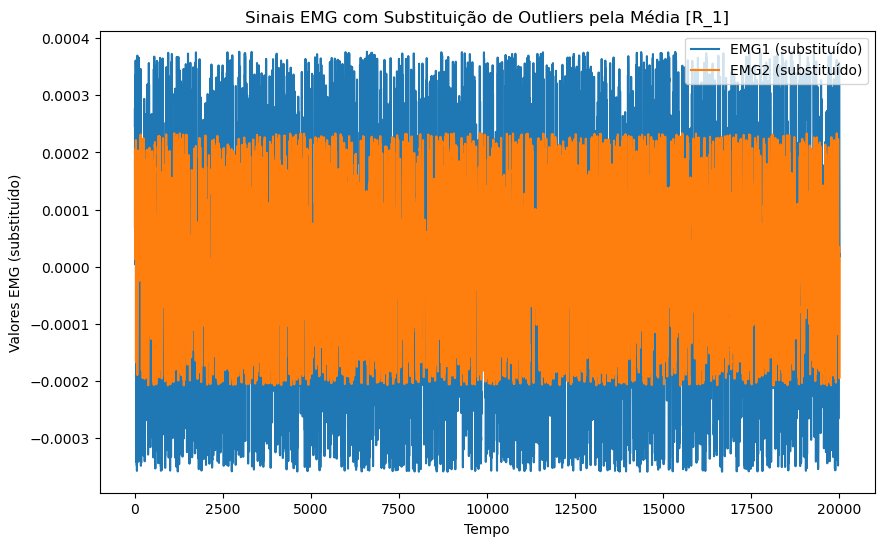

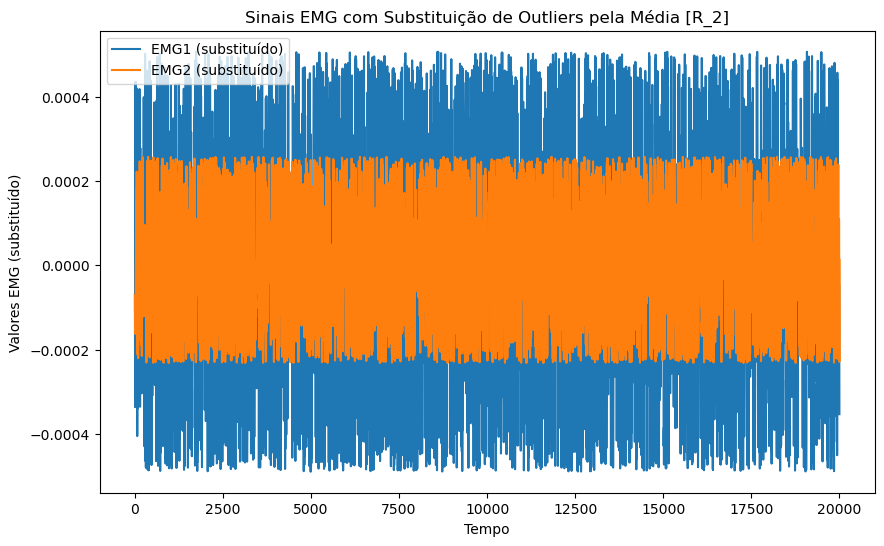

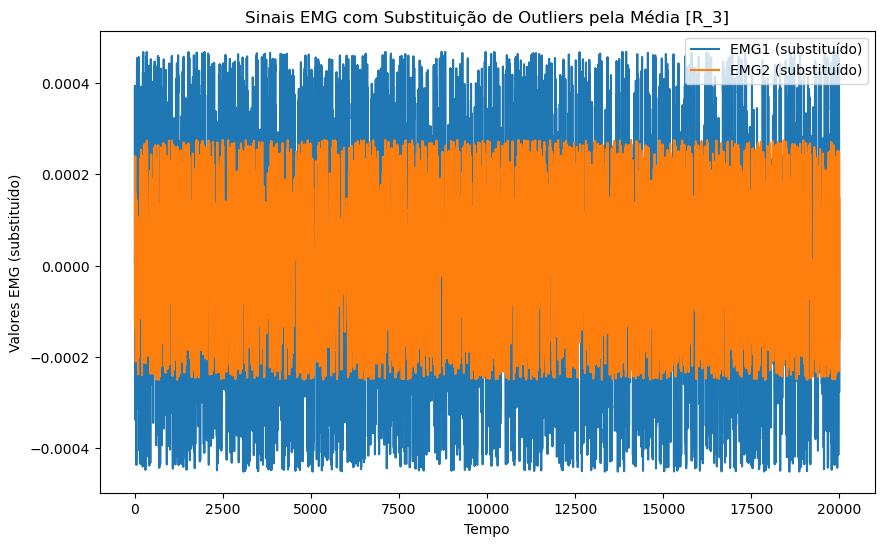

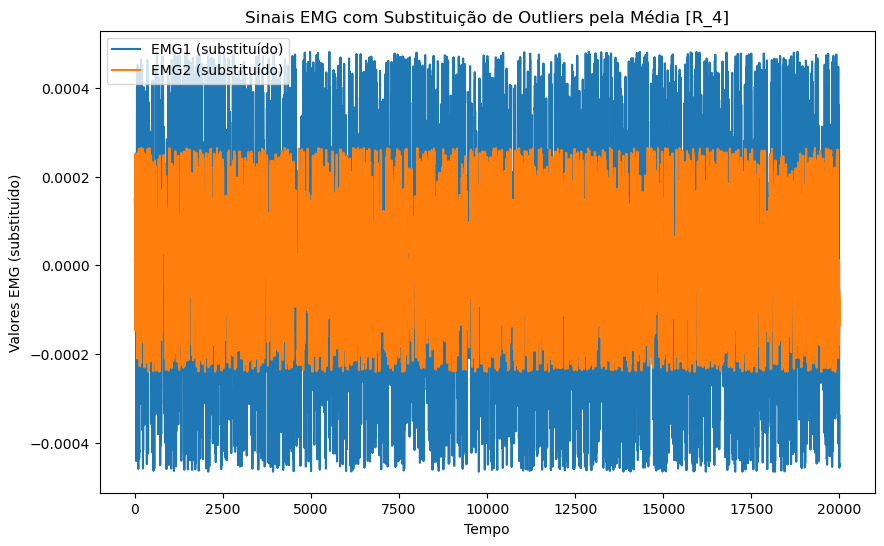

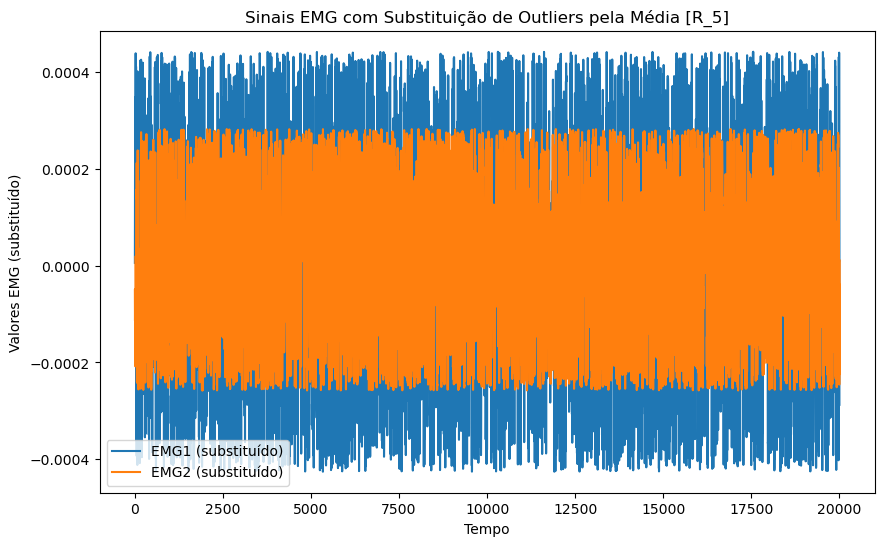

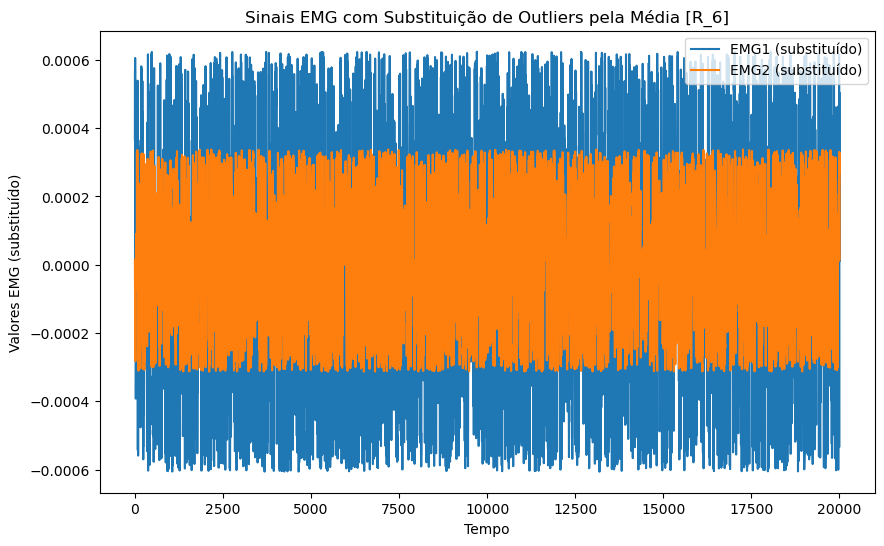

In [192]:
# Lista para armazenar os DataFrames resultantes
df_R_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_R_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (R_1, R_2, ..., R_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_R_1, df_R_2, ..., df_R_6)
    df_name = f'df_R_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_R_no_outliers_current = df_current.copy()
    df_R_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_R_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_R_no_outliers_list.append(df_R_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_R_no_outliers_current.index, df_R_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_R_no_outliers_current.index, df_R_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [R_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_R_no_outliers.append(df_R_no_outliers_current)


In [193]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_R_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_R = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_R{i+1}'] = caracteristicas_emg_R

## T-I

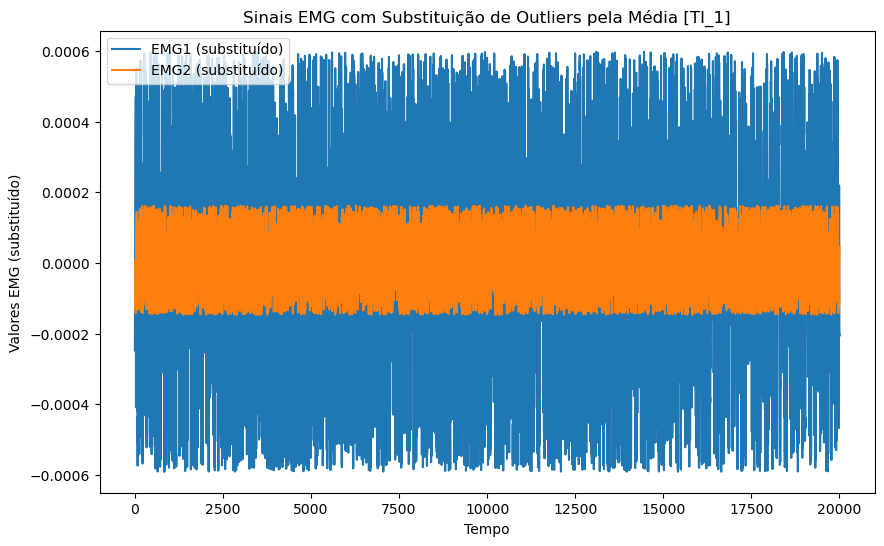

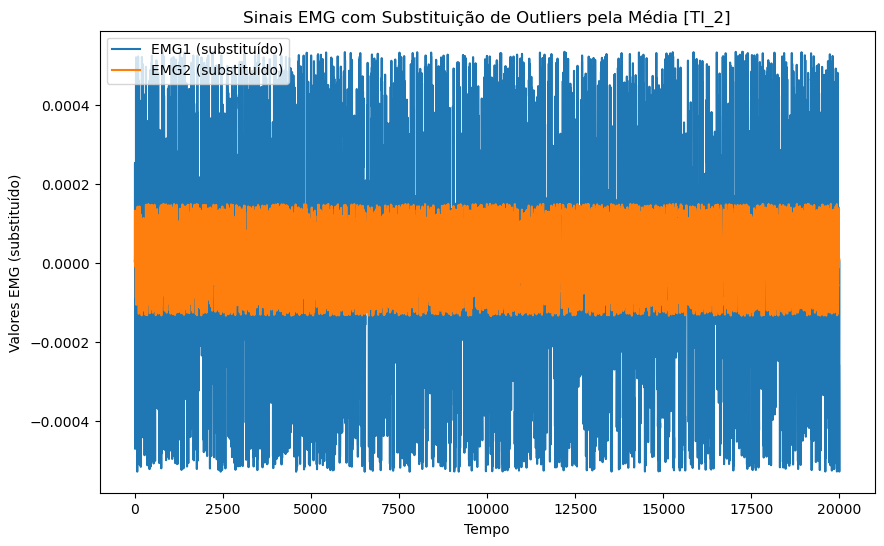

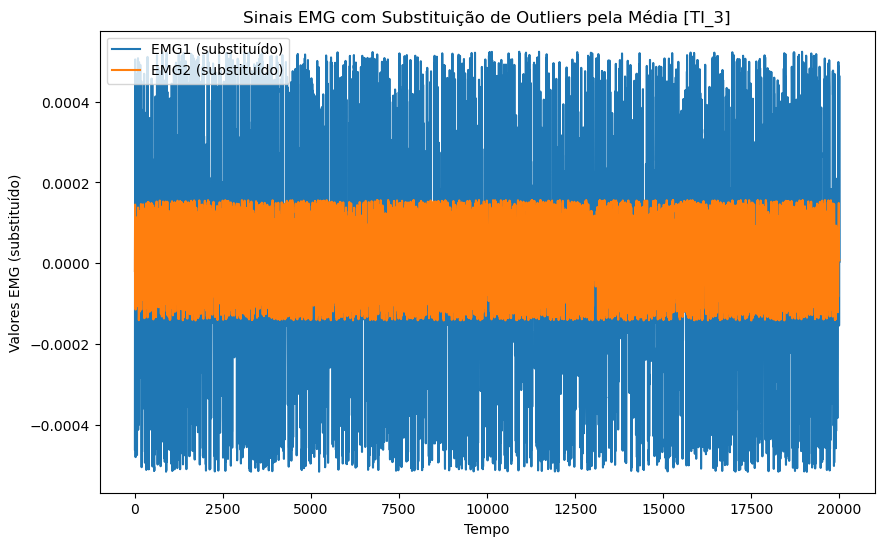

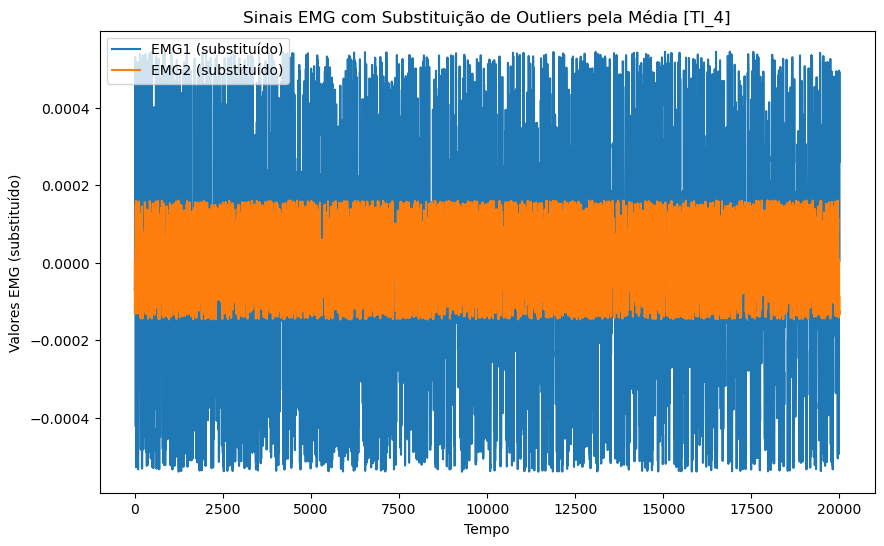

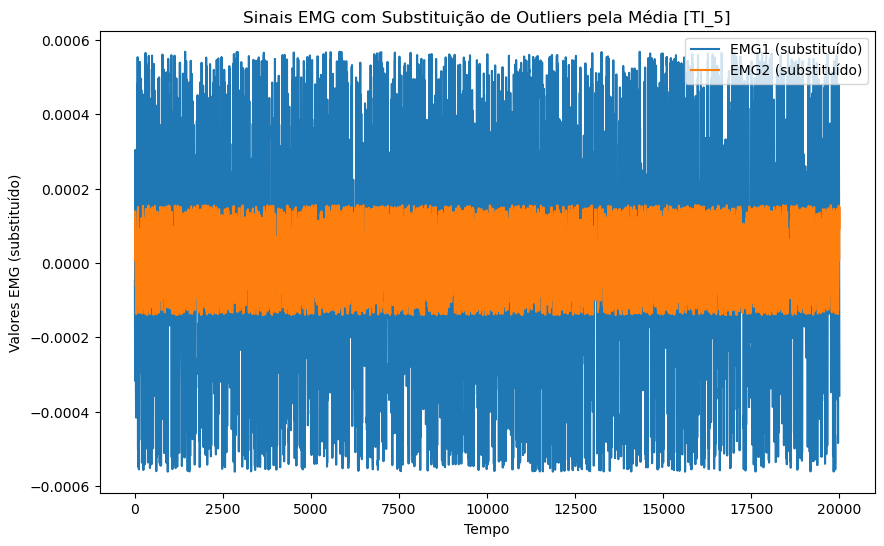

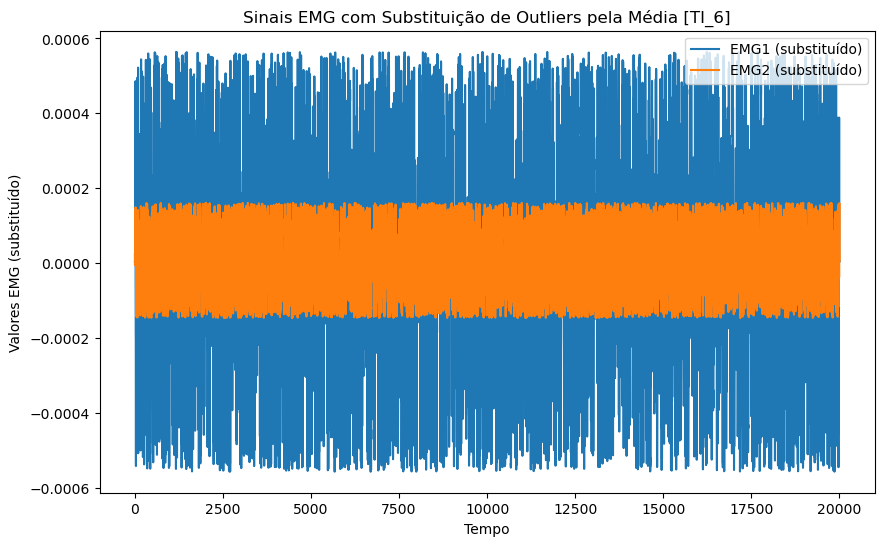

In [194]:
# Lista para armazenar os DataFrames resultantes
df_TI_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_TI_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (TI_1, TI_2, ..., TI_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_TI_1, df_TI_2, ..., df_TI_6)
    df_name = f'df_TI_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_TI_no_outliers_current = df_current.copy()
    df_TI_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_TI_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_TI_no_outliers_list.append(df_TI_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_TI_no_outliers_current.index, df_TI_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_TI_no_outliers_current.index, df_TI_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [TI_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_TI_no_outliers.append(df_TI_no_outliers_current)


In [195]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_TI_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_TI = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_TI{i+1}'] = caracteristicas_emg_TI

## T-L

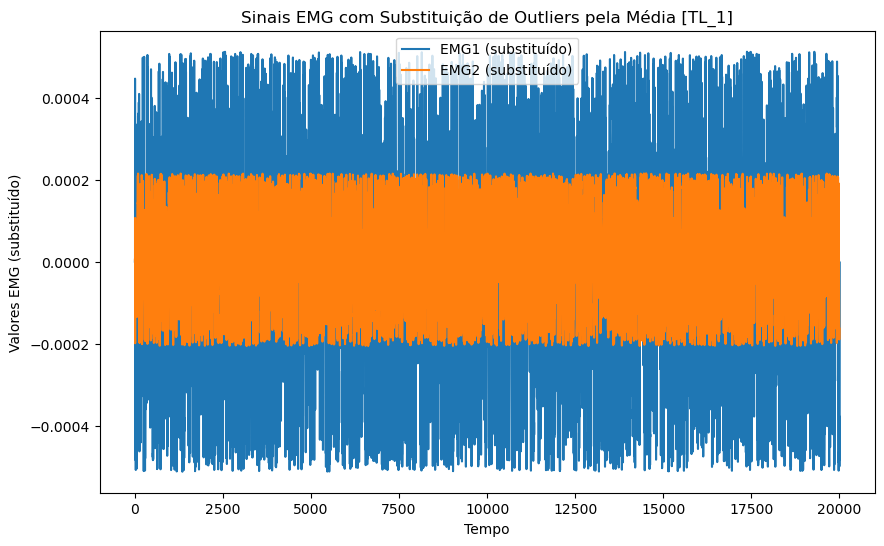

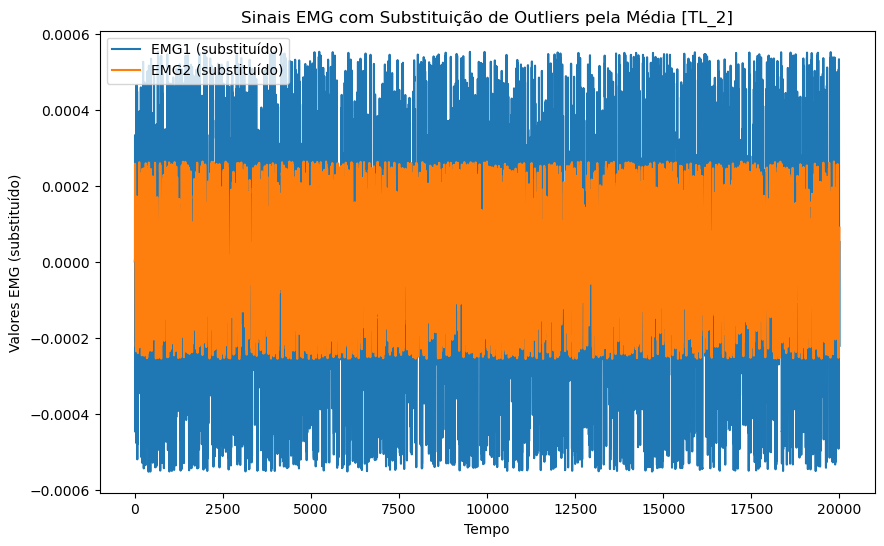

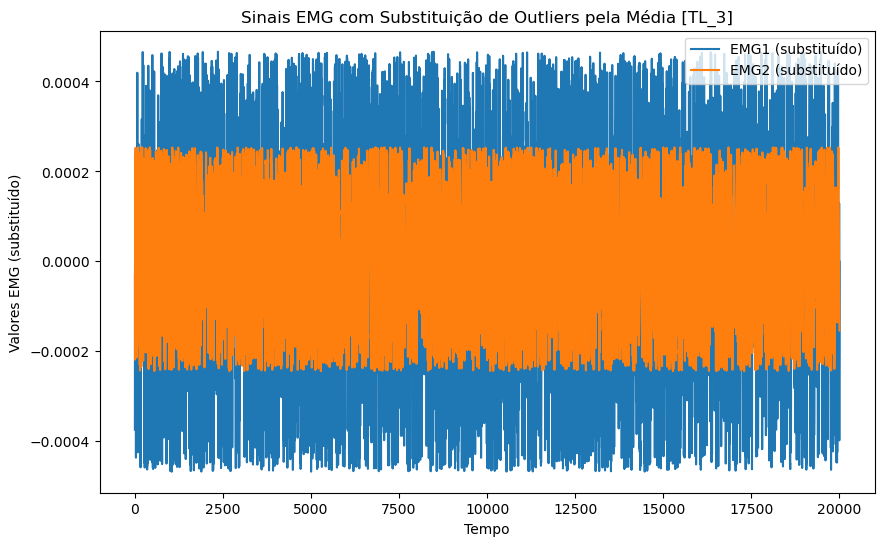

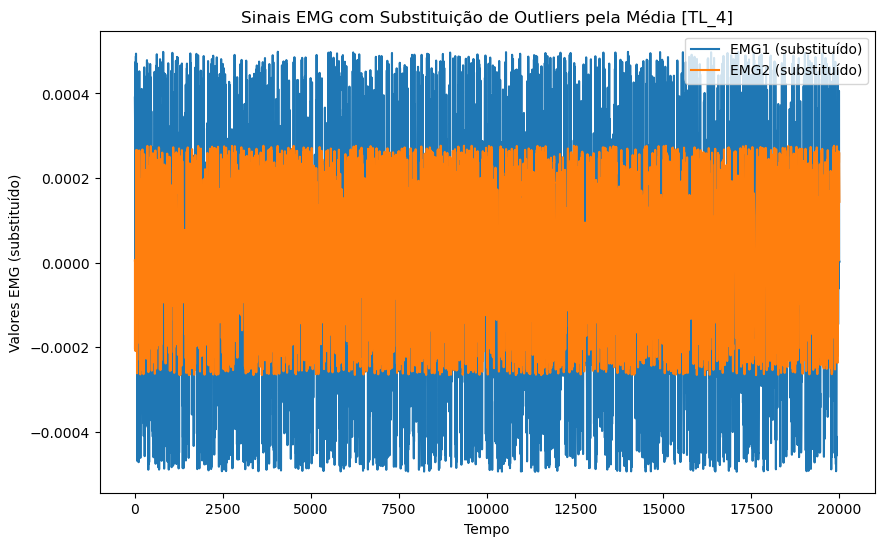

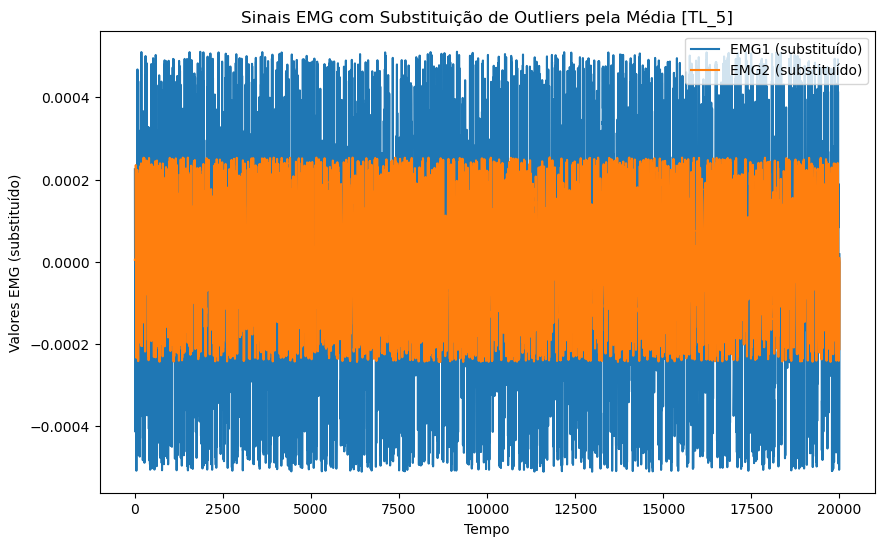

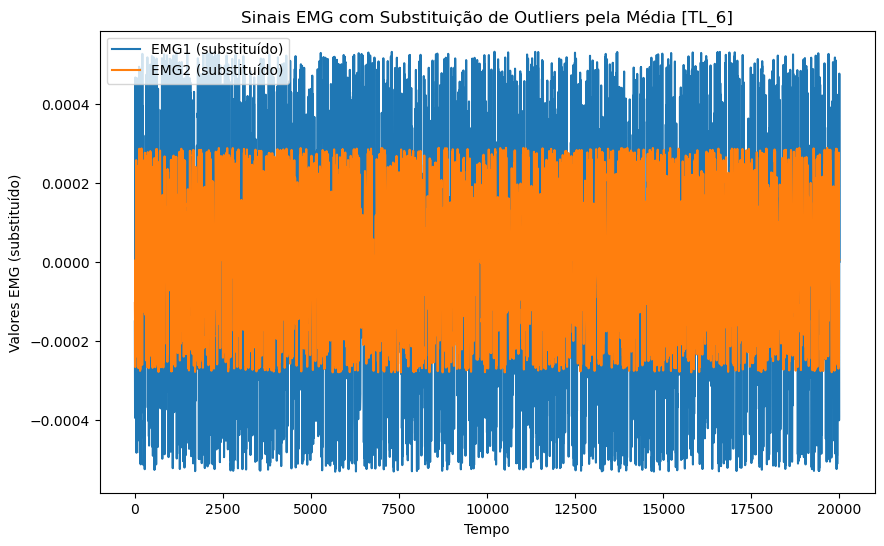

In [196]:
# Lista para armazenar os DataFrames resultantes
df_TL_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_TL_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (TL_1, TL_2, ..., TL_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_TL_1, df_TL_2, ..., df_TL_6)
    df_name = f'df_TL_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_TL_no_outliers_current = df_current.copy()
    df_TL_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_TL_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_TL_no_outliers_list.append(df_TL_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_TL_no_outliers_current.index, df_TL_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_TL_no_outliers_current.index, df_TL_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [TL_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_TL_no_outliers.append(df_TL_no_outliers_current)


In [197]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_TL_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_TL = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_TL{i+1}'] = caracteristicas_emg_TL

## TM

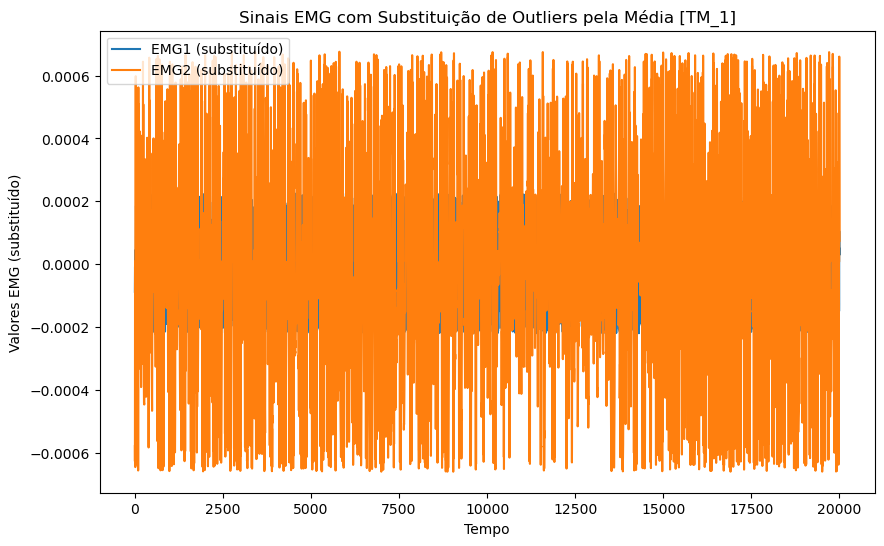

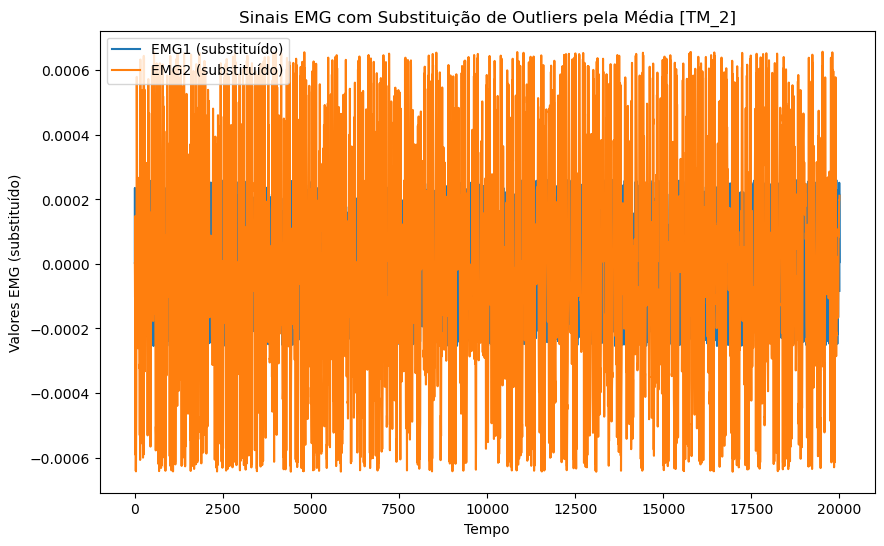

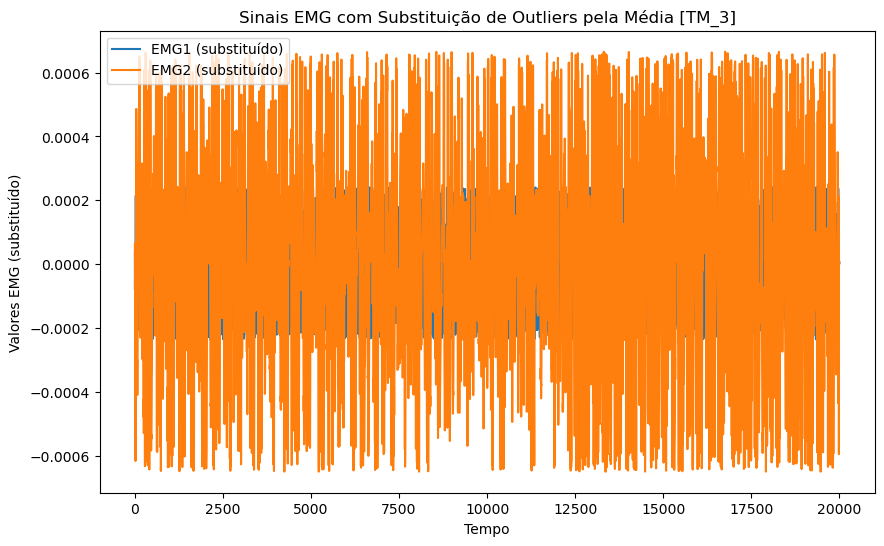

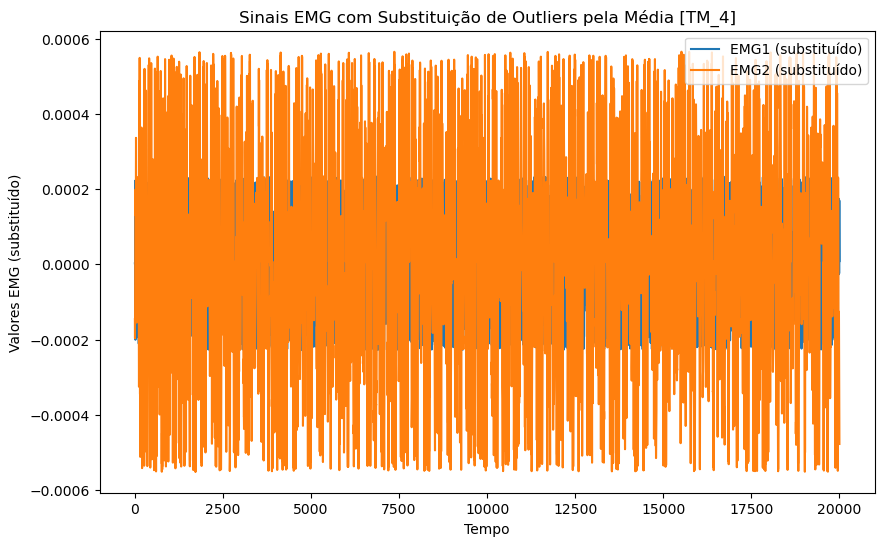

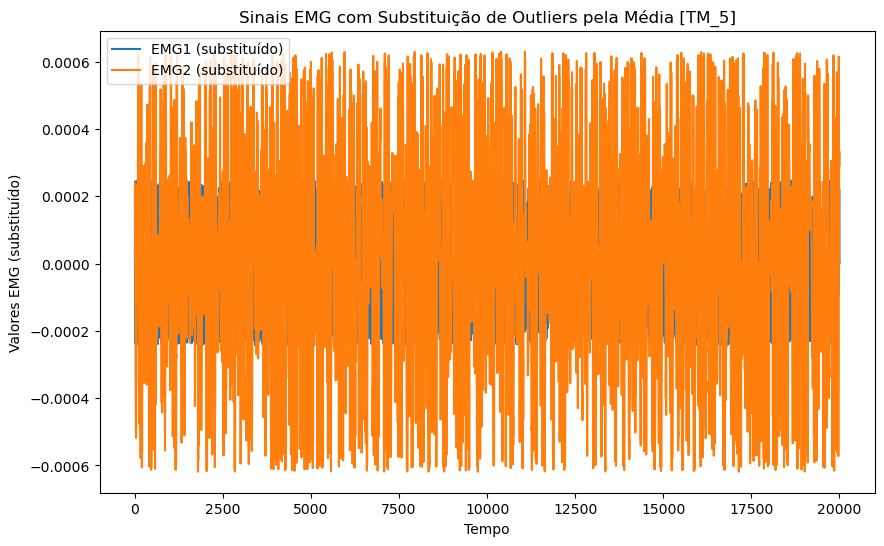

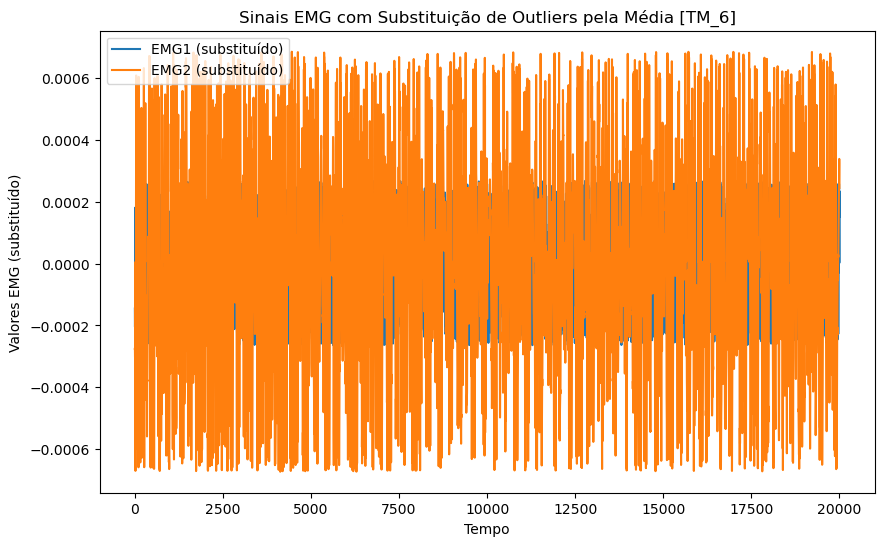

In [198]:
# Lista para armazenar os DataFrames resultantes
df_TM_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_TM_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (TM_1, TM_2, ..., TM_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_TM_1, df_TM_2, ..., df_TM_6)
    df_name = f'df_TM_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_TM_no_outliers_current = df_current.copy()
    df_TM_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_TM_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_TM_no_outliers_list.append(df_TM_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_TM_no_outliers_current.index, df_TM_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_TM_no_outliers_current.index, df_TM_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [TM_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_TM_no_outliers.append(df_TM_no_outliers_current)


In [199]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_TM_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_TM = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_TM{i+1}'] = caracteristicas_emg_TM

## TR

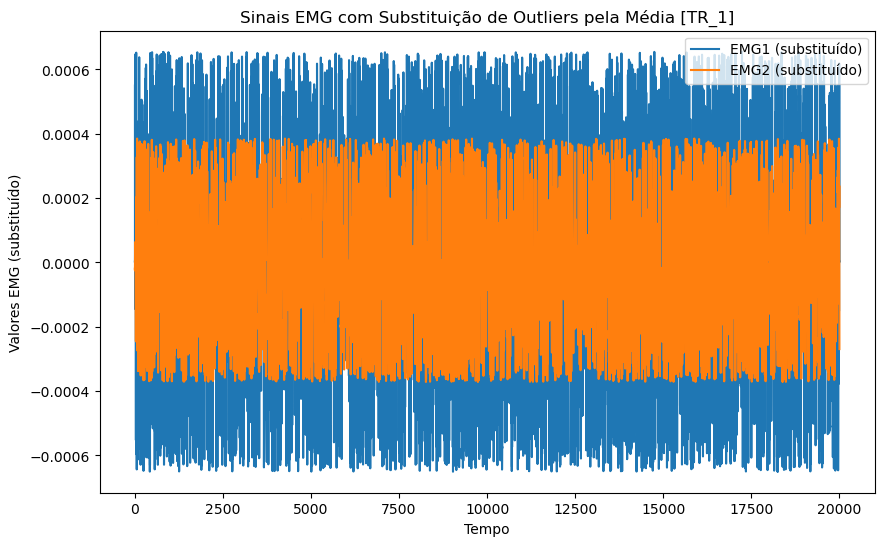

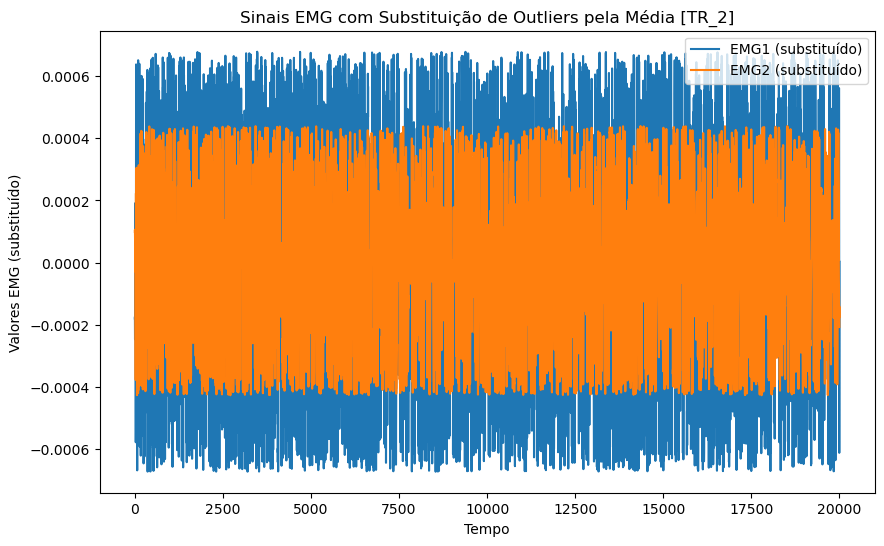

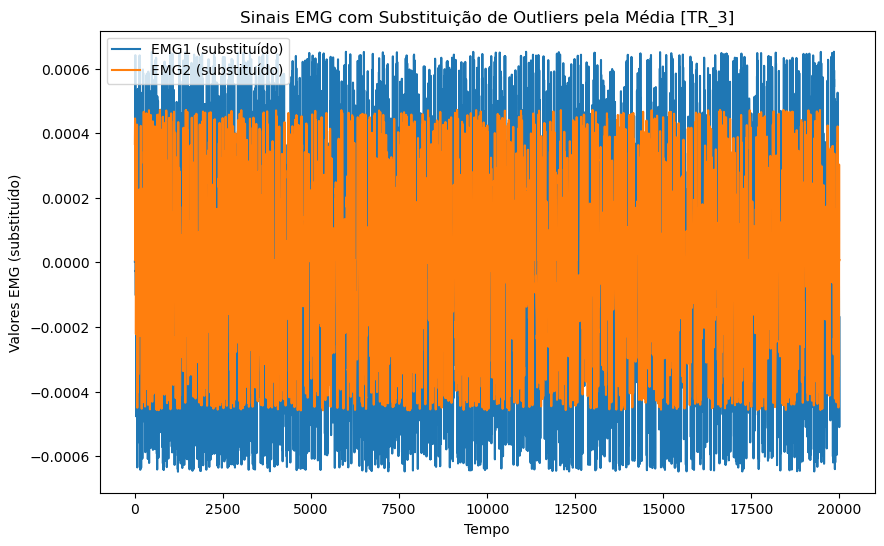

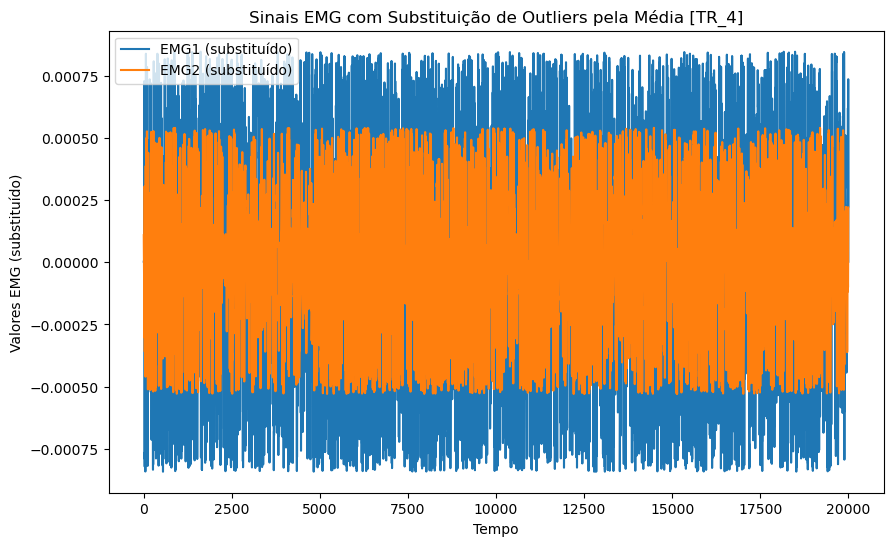

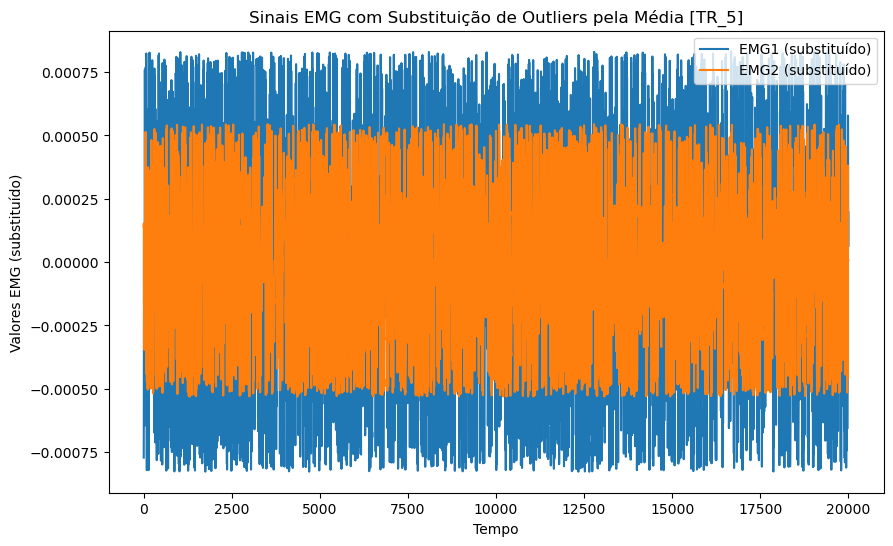

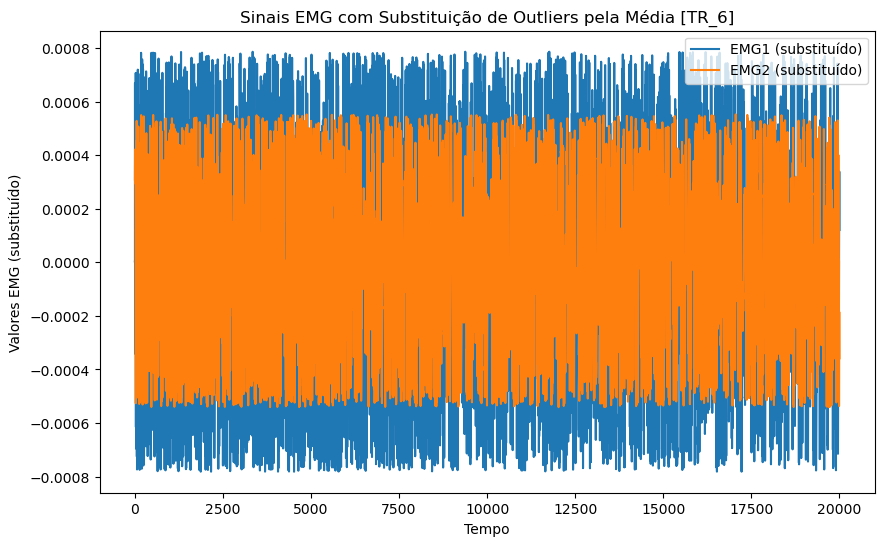

In [200]:
# Lista para armazenar os DataFrames resultantes
df_TR_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_TR_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (TR_1, TR_2, ..., TR_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_TR_1, df_TR_2, ..., df_TR_6)
    df_name = f'df_TR_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_TR_no_outliers_current = df_current.copy()
    df_TR_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_TR_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_TR_no_outliers_list.append(df_TR_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_TR_no_outliers_current.index, df_TR_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_TR_no_outliers_current.index, df_TR_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [TR_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_TR_no_outliers.append(df_TR_no_outliers_current)


In [201]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_TR_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_TR = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_TR{i+1}'] = caracteristicas_emg_TR

## TT

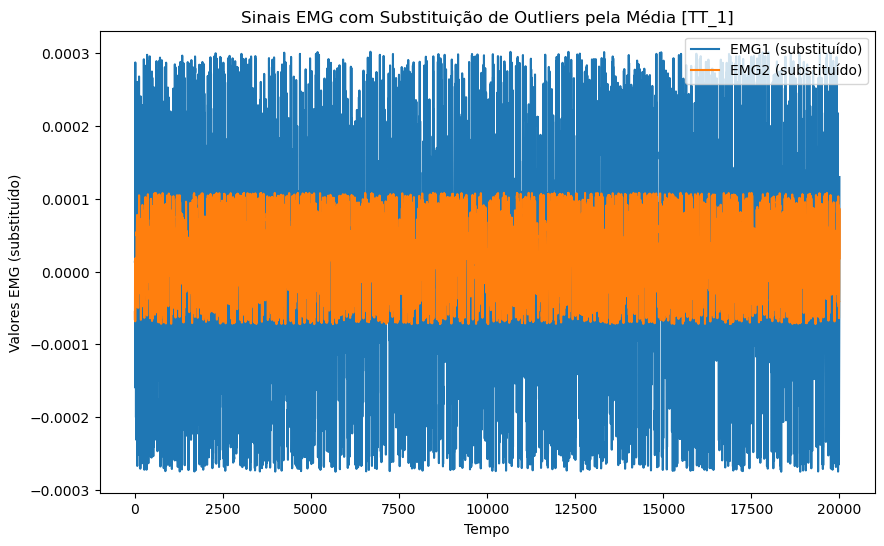

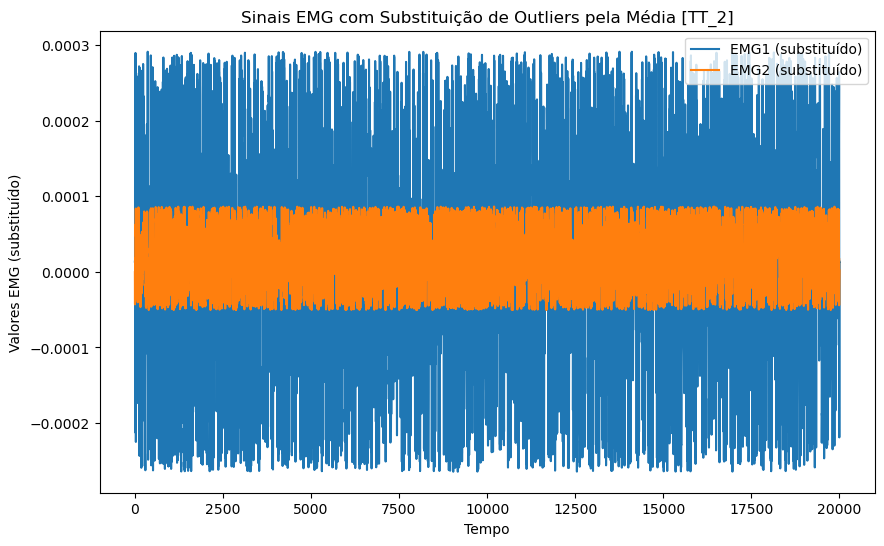

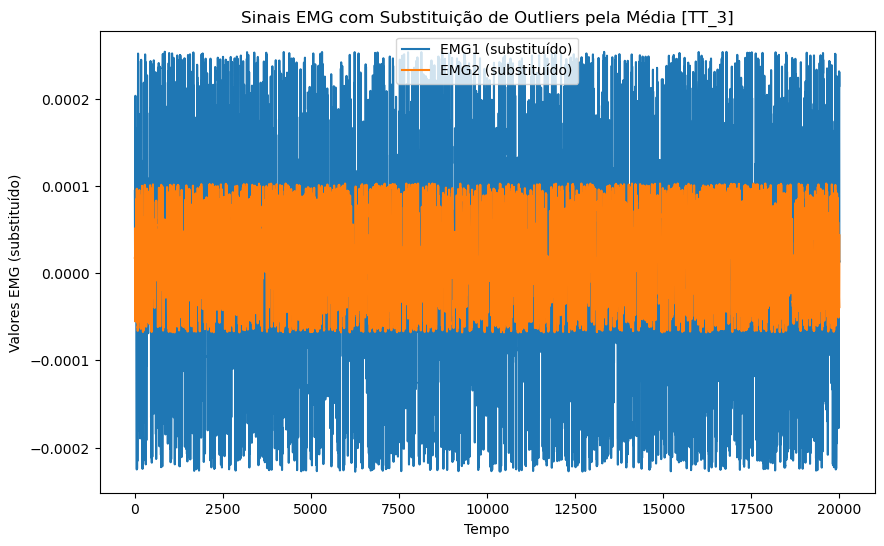

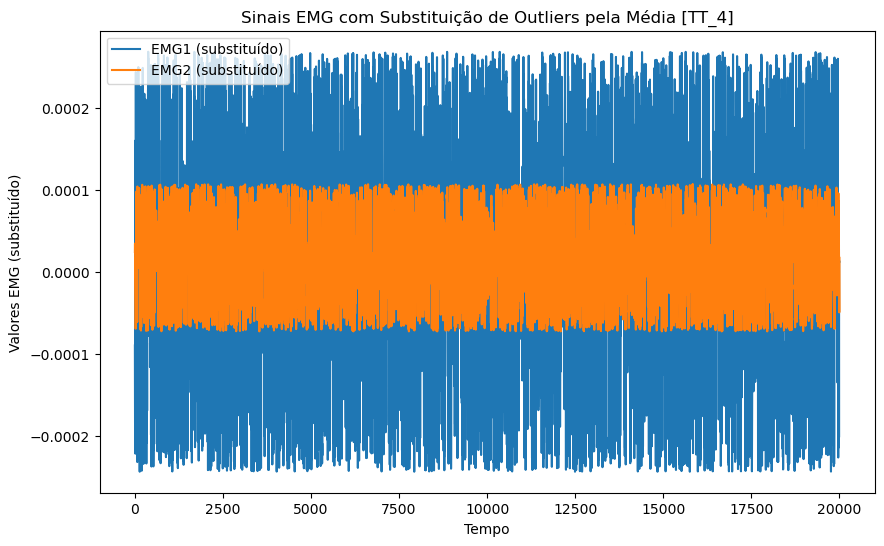

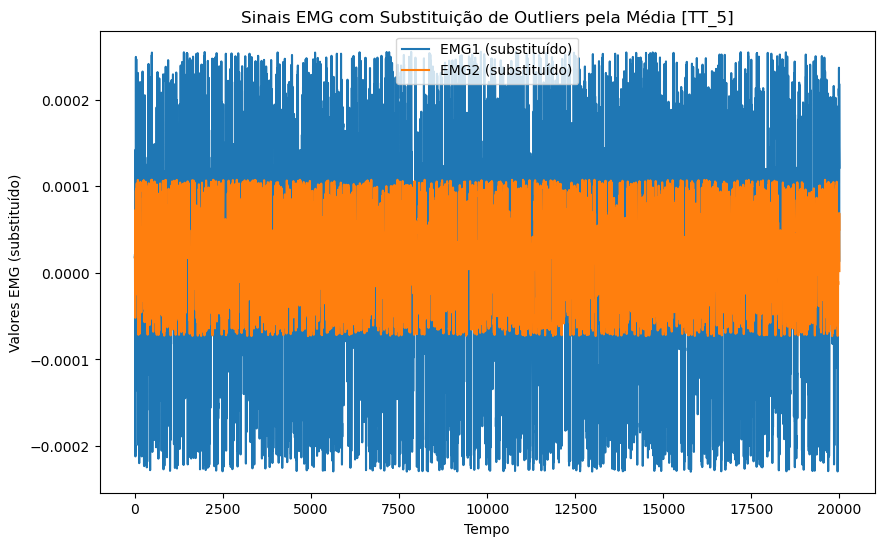

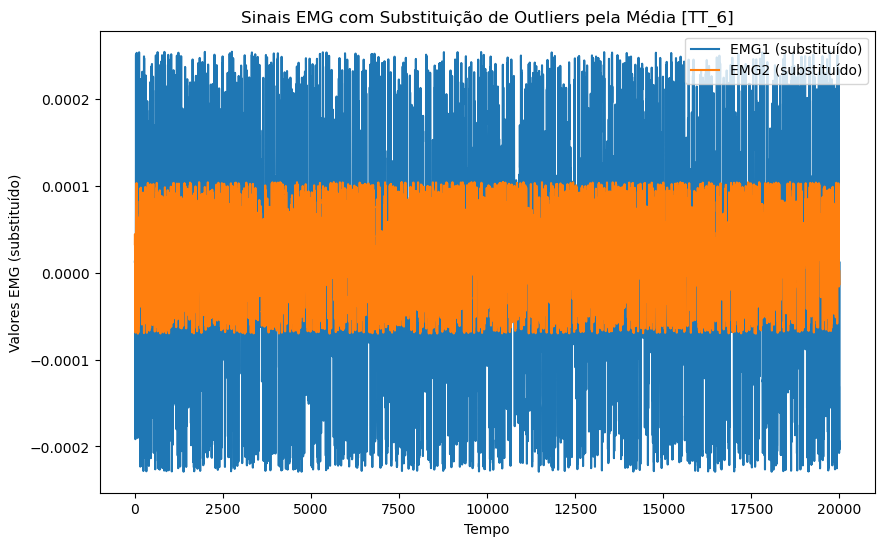

In [202]:
# Lista para armazenar os DataFrames resultantes
df_TT_no_outliers_list = []

# Lista para armazenar os DataFrames no outliers
df_TT_no_outliers = []

# Iteração sobre os diferentes conjuntos de dados (TT_1, TT_2, ..., TT_6)
for i in range(1, 7):
    # Criar o nome do DataFrame (df_TT_1, df_TT_2, ..., df_TT_6)
    df_name = f'df_TT_{i}'

    # Acessar o DataFrame correspondente
    df_current = globals()[df_name]

    # Calcular o escore Z
    z_scores_emg1 = zscore(df_current['EMG1'])
    z_scores_emg2 = zscore(df_current['EMG2'])

    # Limiar
    outliers_emg1 = (z_scores_emg1 > limiar_z) | (z_scores_emg1 < -limiar_z)
    outliers_emg2 = (z_scores_emg2 > limiar_z) | (z_scores_emg2 < -limiar_z)

    # Substituir outliers pela média
    media_emg1 = df_current['EMG1'].mean()
    media_emg2 = df_current['EMG2'].mean()

    df_TT_no_outliers_current = df_current.copy()
    df_TT_no_outliers_current.loc[outliers_emg1, 'EMG1'] = media_emg1
    df_TT_no_outliers_current.loc[outliers_emg2, 'EMG2'] = media_emg2

    # Adicionar o DataFrame resultante à lista
    df_TT_no_outliers_list.append(df_TT_no_outliers_current)

    # Plotar os sinais substituindo outliers pela média
    plt.figure(figsize=(10, 6))
    plt.plot(df_TT_no_outliers_current.index, df_TT_no_outliers_current['EMG1'], label='EMG1 (substituído)')
    plt.plot(df_TT_no_outliers_current.index, df_TT_no_outliers_current['EMG2'], label='EMG2 (substituído)')

    # Adicionar rótulos e título
    plt.xlabel('Tempo')
    plt.ylabel('Valores EMG (substituído)')
    plt.title(f'Sinais EMG com Substituição de Outliers pela Média [TT_{i}]')
    plt.legend()
    plt.show()

    # Adicionar o DataFrame no outliers à lista
    df_TT_no_outliers.append(df_TT_no_outliers_current)


In [203]:
# Iteração sobre a lista de DataFrames no outliers
for i, df_current in enumerate(df_TT_no_outliers):
    # Extrair apenas as colunas relevantes
    dados_emg = df_current[colunas_relevantes]

    # Converter o DataFrame para uma matriz NumPy
    matriz_emg = dados_emg.to_numpy()

    # Chamar a função getfTDD_feat_v2
    caracteristicas_emg_TT = getfTDDfeat_v2(matriz_emg, steps, winsize, wininc)

    # Agora, 'caracteristicas_emg_L' deve conter as características resultantes para cada conjunto de dados L_1, L_2, ..., L_6
    globals()[f'caracteristicas_emg_TT{i+1}'] = caracteristicas_emg_TT

In [204]:
# Converta as matrizes NumPy em DataFrames

# ... Faça o mesmo para os outros dataframes HC ...
df_caracteristicas_emg_HC1 = pd.DataFrame(caracteristicas_emg_HC1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC1.shape[1])])
df_caracteristicas_emg_HC2 = pd.DataFrame(caracteristicas_emg_HC2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC2.shape[1])])
df_caracteristicas_emg_HC3 = pd.DataFrame(caracteristicas_emg_HC3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC3.shape[1])])
df_caracteristicas_emg_HC4 = pd.DataFrame(caracteristicas_emg_HC4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC4.shape[1])])
df_caracteristicas_emg_HC5 = pd.DataFrame(caracteristicas_emg_HC5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC5.shape[1])])
df_caracteristicas_emg_HC6 = pd.DataFrame(caracteristicas_emg_HC6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_HC6.shape[1])])

# ... Faça o mesmo para os outros dataframes I ...
df_caracteristicas_emg_I1 = pd.DataFrame(caracteristicas_emg_I1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I1.shape[1])])
df_caracteristicas_emg_I2 = pd.DataFrame(caracteristicas_emg_I2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I2.shape[1])])
df_caracteristicas_emg_I3 = pd.DataFrame(caracteristicas_emg_I3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I3.shape[1])])
df_caracteristicas_emg_I4 = pd.DataFrame(caracteristicas_emg_I4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I4.shape[1])])
df_caracteristicas_emg_I5 = pd.DataFrame(caracteristicas_emg_I5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I5.shape[1])])
df_caracteristicas_emg_I6 = pd.DataFrame(caracteristicas_emg_I6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_I6.shape[1])])

# ... Faça o mesmo para os outros dataframes L ...
df_caracteristicas_emg_L1 = pd.DataFrame(caracteristicas_emg_L1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L1.shape[1])])
df_caracteristicas_emg_L2 = pd.DataFrame(caracteristicas_emg_L2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L2.shape[1])])
df_caracteristicas_emg_L3 = pd.DataFrame(caracteristicas_emg_L3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L3.shape[1])])
df_caracteristicas_emg_L4 = pd.DataFrame(caracteristicas_emg_L4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L4.shape[1])])
df_caracteristicas_emg_L5 = pd.DataFrame(caracteristicas_emg_L5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L5.shape[1])])
df_caracteristicas_emg_L6 = pd.DataFrame(caracteristicas_emg_L6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_L6.shape[1])])

# ... Faça o mesmo para os outros dataframes M ...
df_caracteristicas_emg_M1 = pd.DataFrame(caracteristicas_emg_M1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M1.shape[1])])
df_caracteristicas_emg_M2 = pd.DataFrame(caracteristicas_emg_M2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M2.shape[1])])
df_caracteristicas_emg_M3 = pd.DataFrame(caracteristicas_emg_M3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M3.shape[1])])
df_caracteristicas_emg_M4 = pd.DataFrame(caracteristicas_emg_M4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M4.shape[1])])
df_caracteristicas_emg_M5 = pd.DataFrame(caracteristicas_emg_M5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M5.shape[1])])
df_caracteristicas_emg_M6 = pd.DataFrame(caracteristicas_emg_M6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_M6.shape[1])])

# ... Faça o mesmo para os outros dataframes R ...
df_caracteristicas_emg_R1 = pd.DataFrame(caracteristicas_emg_R1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R1.shape[1])])
df_caracteristicas_emg_R2 = pd.DataFrame(caracteristicas_emg_R2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R2.shape[1])])
df_caracteristicas_emg_R3 = pd.DataFrame(caracteristicas_emg_R3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R3.shape[1])])
df_caracteristicas_emg_R4 = pd.DataFrame(caracteristicas_emg_R4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R4.shape[1])])
df_caracteristicas_emg_R5 = pd.DataFrame(caracteristicas_emg_R5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R5.shape[1])])
df_caracteristicas_emg_R6 = pd.DataFrame(caracteristicas_emg_R6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_R6.shape[1])])

# ... Faça o mesmo para os outros dataframes T-I ...
df_caracteristicas_emg_TI1 = pd.DataFrame(caracteristicas_emg_TI1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI1.shape[1])])
df_caracteristicas_emg_TI2 = pd.DataFrame(caracteristicas_emg_TI2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI2.shape[1])])
df_caracteristicas_emg_TI3 = pd.DataFrame(caracteristicas_emg_TI3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI3.shape[1])])
df_caracteristicas_emg_TI4 = pd.DataFrame(caracteristicas_emg_TI4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI4.shape[1])])
df_caracteristicas_emg_TI5 = pd.DataFrame(caracteristicas_emg_TI5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI5.shape[1])])
df_caracteristicas_emg_TI6 = pd.DataFrame(caracteristicas_emg_TI6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TI6.shape[1])])

# ... Faça o mesmo para os outros dataframes T-L ...
df_caracteristicas_emg_TL1 = pd.DataFrame(caracteristicas_emg_TL1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL1.shape[1])])
df_caracteristicas_emg_TL2 = pd.DataFrame(caracteristicas_emg_TL2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL2.shape[1])])
df_caracteristicas_emg_TL3 = pd.DataFrame(caracteristicas_emg_TL3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL3.shape[1])])
df_caracteristicas_emg_TL4 = pd.DataFrame(caracteristicas_emg_TL4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL4.shape[1])])
df_caracteristicas_emg_TL5 = pd.DataFrame(caracteristicas_emg_TL5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL5.shape[1])])
df_caracteristicas_emg_TL6 = pd.DataFrame(caracteristicas_emg_TL6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TL6.shape[1])])

# ... Faça o mesmo para os outros dataframes T-M ...
df_caracteristicas_emg_TM1 = pd.DataFrame(caracteristicas_emg_TM1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM1.shape[1])])
df_caracteristicas_emg_TM2 = pd.DataFrame(caracteristicas_emg_TM2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM2.shape[1])])
df_caracteristicas_emg_TM3 = pd.DataFrame(caracteristicas_emg_TM3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM3.shape[1])])
df_caracteristicas_emg_TM4 = pd.DataFrame(caracteristicas_emg_TM4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM4.shape[1])])
df_caracteristicas_emg_TM5 = pd.DataFrame(caracteristicas_emg_TM5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM5.shape[1])])
df_caracteristicas_emg_TM6 = pd.DataFrame(caracteristicas_emg_TM6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TM6.shape[1])])

# ... Faça o mesmo para os outros dataframes T-R ...
df_caracteristicas_emg_TR1 = pd.DataFrame(caracteristicas_emg_TR1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR1.shape[1])])
df_caracteristicas_emg_TR2 = pd.DataFrame(caracteristicas_emg_TR2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR2.shape[1])])
df_caracteristicas_emg_TR3 = pd.DataFrame(caracteristicas_emg_TR3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR3.shape[1])])
df_caracteristicas_emg_TR4 = pd.DataFrame(caracteristicas_emg_TR4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR4.shape[1])])
df_caracteristicas_emg_TR5 = pd.DataFrame(caracteristicas_emg_TR5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR5.shape[1])])
df_caracteristicas_emg_TR6 = pd.DataFrame(caracteristicas_emg_TR6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TR6.shape[1])])

# ... Faça o mesmo para os outros dataframes T-T ...
df_caracteristicas_emg_TT1 = pd.DataFrame(caracteristicas_emg_TT1, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT1.shape[1])])
df_caracteristicas_emg_TT2 = pd.DataFrame(caracteristicas_emg_TT2, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT2.shape[1])])
df_caracteristicas_emg_TT3 = pd.DataFrame(caracteristicas_emg_TT3, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT3.shape[1])])
df_caracteristicas_emg_TT4 = pd.DataFrame(caracteristicas_emg_TT4, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT4.shape[1])])
df_caracteristicas_emg_TT5 = pd.DataFrame(caracteristicas_emg_TT5, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT5.shape[1])])
df_caracteristicas_emg_TT6 = pd.DataFrame(caracteristicas_emg_TT6, columns=[f'feature_{i}' for i in range(caracteristicas_emg_TT6.shape[1])])

# Agora, 'df_caracteristicas_emg_HC1', 'df_caracteristicas_emg_HC2', ..., 'df_caracteristicas_emg_I1', 'df_caracteristicas_emg_I2', ...
# são DataFrames do pandas que você pode usar para treinar e testar modelos.


In [205]:
# ADICIONA CLASSES PARA CADA UMA DAS VARIÁVEIS df_caracteristicas_emg{SIGLA}{NUMERO}.

# HC = 0 
# I = 1
# L = 2
# M = 3
# R = 4
# TI = 5
# TL = 6
# TM = 7
# TR = 8
# TT = 9

# Lista de prefixos para os DataFrames
prefixos = ['HC', 'I', 'L', 'M', 'R', 'TI', 'TL', 'TM', 'TR', 'TT']

# Lista de sufixos para os DataFrames
sufixos = [str(i) for i in range(1, 7)]

# Loop para adicionar coluna de classe aos DataFrames
for prefixo in prefixos:
    for sufixo in sufixos:
        # Crie o nome da variável
        nome_variavel = f'df_caracteristicas_emg_{prefixo}{sufixo}'
        
        # Adicione uma coluna de classe
        globals()[nome_variavel]['class'] = int(prefixos.index(prefixo))

In [206]:
df_caracteristicas_emg_HC1.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,class
0,575.424751,569.536967,23.852507,26.884972,3.367874,4.825779,94.178825,81.424388,0.030765,0.035411,35.766461,34.114923,0
1,577.708422,567.061959,23.515860,27.007394,3.327181,4.736716,95.379051,80.836312,0.029715,0.036415,38.121288,36.833964,0
2,575.012052,570.254726,23.692193,27.468559,3.529247,4.732711,93.340554,80.989595,0.029966,0.036926,33.506140,37.803257,0
3,574.209718,567.195720,25.344601,25.259984,4.237431,4.017805,86.706299,86.623736,0.032071,0.034278,33.495838,35.809972,0
4,576.902515,567.426434,23.532864,29.218620,3.326083,5.778012,95.286460,73.171226,0.029941,0.038885,37.971078,25.629550,0


In [207]:
df_caracteristicas_emg_TT1.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,class
0,547.858868,504.401261,26.507312,29.399691,4.863087,7.168802,76.617874,56.377975,0.039133,0.051903,33.881666,15.285542,9
1,547.783803,512.437757,25.346513,40.308695,4.540463,14.233311,79.504701,40.342958,0.036184,0.068608,27.382295,16.036865,9
2,546.531821,508.041965,24.822107,26.388828,4.154240,5.693059,81.418413,65.135106,0.036404,0.044477,28.636919,29.293563,9
3,547.351461,509.333470,29.521809,31.728844,6.467342,8.360016,67.994458,53.733714,0.042892,0.054090,30.425591,16.528355,9
4,548.901445,507.607820,25.404906,29.089712,4.206604,7.147693,81.009351,58.649324,0.037073,0.050109,30.941491,24.824705,9
